# Project: Study the difference in term of gene expression in Aorta and Heart cells from mice. 

## Hugo Hakem, Meng BIOE 23-24

Data used in this project are extracted from Tabula Muris: 
https://tabula-muris.ds.czbiohub.org/

In particular, the datasets can be found following this link:
https://figshare.com/articles/dataset/Single-cell_RNA-seq_data_from_Smart-seq2_sequencing_of_FACS_sorted_cells_v2_/5829687?file=13088129
where Aorta, and Heart sub datasets have been used and Metadata and Annotations as well.

This project has been run using code extracted from HW3 and HW4 from the Berkeley BIOE249: Computational Functional Genomics taught by the professor Liana Lareau.  

## NB: if I and II has already been run once, please jump to part III. 

# I Installation

#### I.1) Library to preprocess our data / project on principal component (PCA / UMAP) / Clustering techniques

In [ ]:
%%bash
#run this everytime you restart your kernel or relaunch the server
pip install scprep
pip install umap-learn
pip install phate 
pip install phenograph
pip install tasklogger 

#### I.2) Library for bash correction

In [2]:
pip install harmonypy

  Using cached harmonypy-0.0.9-py3-none-any.whl (20 kB)
Note: you may need to restart the kernel to use updated packages.


#### I.3) Import

In [3]:
#run this cell every time you start working on the notebook
import pandas as pd
import numpy as np
import scprep, umap 


import sklearn
import sklearn.cluster
import sklearn.manifold
import graphtools as gt
import phenograph
import matplotlib.pyplot as plt
import tasklogger

import harmonypy as hm

%matplotlib inline

#### I.4) Data loading

In [4]:
%%bash
pwd

/home/jovyan/Computational_Genomics/Final_Project


In [5]:
## Read in the Aorta counts 
aorta_data = scprep.io.load_csv("Aorta-counts.csv",
                          cell_axis='row', sparse=True).transpose()
aorta_data.head()

,0610005C13Rik,0610007C21Rik,0610007L01Rik,0610007N19Rik,0610007P08Rik,0610007P14Rik,0610007P22Rik,0610008F07Rik,0610009B14Rik,0610009B22Rik,...,Zxdb,Zxdc,Zyg11a,Zyg11b,Zyx,Zzef1,Zzz3,a,l7Rn6,zsGreen_transgene
A21.MAA000594.3_8_M.1.1,0.0,406.0,714.0,0.0,358.0,0.0,0.0,0.0,0.0,242.0,...,0.0,0.0,0.0,0.0,1150.0,0.0,0.0,0.0,345.0,0.0
D1.MAA000594.3_8_M.1.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,142.0,0.0,0.0,0.0,0.0,0.0
F8.MAA000594.3_8_M.1.1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
H11.MAA000594.3_8_M.1.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,281.0,0.0,0.0,0.0,0.0
N15.MAA000594.3_8_M.1.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [6]:
## Read in the Heart counts 
heart_data = scprep.io.load_csv("Heart-counts.csv",
                          cell_axis='row', sparse=True).transpose()

heart_data.head()

,0610005C13Rik,0610007C21Rik,0610007L01Rik,0610007N19Rik,0610007P08Rik,0610007P14Rik,0610007P22Rik,0610008F07Rik,0610009B14Rik,0610009B22Rik,...,Zxdb,Zxdc,Zyg11a,Zyg11b,Zyx,Zzef1,Zzz3,a,l7Rn6,zsGreen_transgene
B12.MAA000398.3_9_M.1.1,0.0,272.0,93.0,65.0,1.0,0.0,0.0,0.0,0.0,0.0,...,8.0,0.0,0.0,0.0,68.0,1.0,0.0,0.0,17.0,0.0
D16.MAA000398.3_9_M.1.1,0.0,21.0,95.0,0.0,0.0,0.0,0.0,0.0,0.0,34.0,...,0.0,0.0,0.0,0.0,389.0,3.0,6.0,0.0,41.0,0.0
F10.MAA000398.3_9_M.1.1,0.0,54.0,43.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,41.0,0.0,28.0,45.0,0.0,31.0,0.0,19.0,0.0
L17.MAA000398.3_9_M.1.1,0.0,21.0,0.0,27.0,0.0,27.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,50.0,38.0,0.0,0.0,11.0,0.0
N18.MAA000398.3_9_M.1.1,0.0,73.0,82.0,66.0,0.0,0.0,58.0,0.0,0.0,68.0,...,0.0,22.0,0.0,14.0,97.0,99.0,124.0,0.0,39.0,0.0


In [7]:
## Merge the Aorta and Heart count
data = [aorta_data, heart_data]
batch_labels = ['Aorta', 'Heart']

## this combines batches together into a single DataFrame
data, sample_labels = scprep.utils.combine_batches(data, batch_labels)

data

,0610005C13Rik,0610007C21Rik,0610007L01Rik,0610007N19Rik,0610007P08Rik,0610007P14Rik,0610007P22Rik,0610008F07Rik,0610009B14Rik,0610009B22Rik,...,Zxdb,Zxdc,Zyg11a,Zyg11b,Zyx,Zzef1,Zzz3,a,l7Rn6,zsGreen_transgene
A21.MAA000594.3_8_M.1.1_Aorta,0.0,406.0,714.0,0.0,358.0,0.0,0.0,0.0,0.0,242.0,...,0.0,0.0,0.0,0.0,1150.0,0.0,0.0,0.0,345.0,0.0
D1.MAA000594.3_8_M.1.1_Aorta,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,142.0,0.0,0.0,0.0,0.0,0.0
F8.MAA000594.3_8_M.1.1_Aorta,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
H11.MAA000594.3_8_M.1.1_Aorta,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,281.0,0.0,0.0,0.0,0.0
N15.MAA000594.3_8_M.1.1_Aorta,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
A7.MAA100097.3_39_F.1.1_Heart,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
D6.MAA100097.3_39_F.1.1_Heart,0.0,147.0,116.0,0.0,0.0,0.0,0.0,0.0,0.0,157.0,...,0.0,113.0,0.0,123.0,0.0,0.0,193.0,0.0,23.0,0.0
F1.MAA100097.3_38_F.1.1_Heart,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A9.MAA100097.3_39_F.1.1_Heart,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


#### I.4) Metadata loading

In [8]:
lookup = pd.Series(data.index).apply(lambda x: x.split('.')[1])

metadata = pd.read_csv('metadata_FACS.csv', index_col=0).loc[lookup.values].reset_index()
metadata.index = data.index

metadata

,plate.barcode,mouse.id,tissue,subtissue,FACS.selection,mouse.sex
A21.MAA000594.3_8_M.1.1_Aorta,MAA000594,3_8_M,Heart,Aorta,Viable,M
D1.MAA000594.3_8_M.1.1_Aorta,MAA000594,3_8_M,Heart,Aorta,Viable,M
F8.MAA000594.3_8_M.1.1_Aorta,MAA000594,3_8_M,Heart,Aorta,Viable,M
H11.MAA000594.3_8_M.1.1_Aorta,MAA000594,3_8_M,Heart,Aorta,Viable,M
N15.MAA000594.3_8_M.1.1_Aorta,MAA000594,3_8_M,Heart,Aorta,Viable,M
...,...,...,...,...,...,...
A7.MAA100097.3_39_F.1.1_Heart,MAA100097,3_38_F/3_39_F,Heart,LA/RA,cardiomyocytes,F
D6.MAA100097.3_39_F.1.1_Heart,MAA100097,3_38_F/3_39_F,Heart,LA/RA,cardiomyocytes,F
F1.MAA100097.3_38_F.1.1_Heart,MAA100097,3_38_F/3_39_F,Heart,LA/RA,cardiomyocytes,F
A9.MAA100097.3_39_F.1.1_Heart,MAA100097,3_38_F/3_39_F,Heart,LA/RA,cardiomyocytes,F


#### I.5) Annotation loading 
Here all the data are not annotated, it must be because some cells have been evicted during the next step of Data pre-processing as not being relevant enough. While loading the annotation data, there is thus a need to assign a NaN value for not annotated data.

In [9]:
lookup = pd.Series(data.index).apply(lambda x: '_'.join(x.split('_')[0:-1]))
res = pd.read_csv('annotations_facs.csv', index_col=2)
annotation=pd.DataFrame(columns=res.columns.values)
data_annotated=[]
for look in lookup.values:
    if look in res.index.values:
        data_annotated.append(look)
        annotation=annotation.append(res.loc[look])
    else:
        annotation=annotation.append(pd.Series(data=[np.nan for i in range(23)], index=res.columns.values, name=look))
annotation.index = data.index
annotation

/srv/conda/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3548: DtypeWarning: Columns (0,1) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,Neurog3>0_raw,Neurog3>0_scaled,cell_ontology_class,cell_ontology_id,cluster.ids,free_annotation,mouse.id,mouse.sex,plate.barcode,subsetA,...,subsetC,subsetC_cluster.ids,subsetD,subsetD_cluster.ids,subsetE,subsetE_cluster.ids,subtissue,tissue,tissue_tSNE_1,tissue_tSNE_2
A21.MAA000594.3_8_M.1.1_Aorta,NaN,NaN,fibroblast,CL:0000057,3,NaN,3_8_M,M,MAA000594,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Aorta,-15.322284,-5.440012
D1.MAA000594.3_8_M.1.1_Aorta,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
F8.MAA000594.3_8_M.1.1_Aorta,NaN,NaN,erythrocyte,CL:0000232,0,NaN,3_8_M,M,MAA000594,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Aorta,7.898756,-6.459818
H11.MAA000594.3_8_M.1.1_Aorta,NaN,NaN,erythrocyte,CL:0000232,0,NaN,3_8_M,M,MAA000594,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Aorta,14.039970,-3.910648
N15.MAA000594.3_8_M.1.1_Aorta,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
A7.MAA100097.3_39_F.1.1_Heart,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
D6.MAA100097.3_39_F.1.1_Heart,NaN,NaN,cardiac muscle cell,CL:0000746,9,NaN,3_38_F/3_39_F,F,MAA100097,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,LA/RA,Heart,-6.210515,35.822128
F1.MAA100097.3_38_F.1.1_Heart,NaN,NaN,cardiac muscle cell,CL:0000746,9,NaN,3_38_F/3_39_F,F,MAA100097,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,LA/RA,Heart,-6.652750,33.126087
A9.MAA100097.3_39_F.1.1_Heart,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# II Data filtering
#### II.1) Library size filtering

<AxesSubplot:title={'center':'Library size before filtering'}, xlabel='Library size', ylabel='Number of cells'>

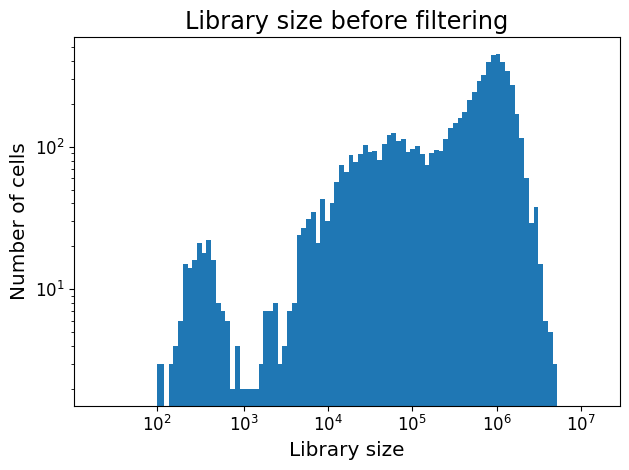

In [10]:
## Visualization of the raw data.
scprep.plot.plot_library_size(data,100, log=True, title='Library size before filtering')

<AxesSubplot:title={'center':'Library size before filtering'}, xlabel='Library size', ylabel='Number of cells'>

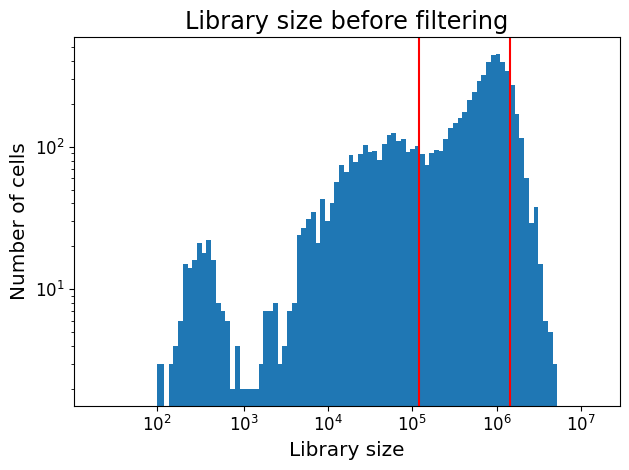

In [11]:
percentiles = (30, 90)
scprep.plot.plot_library_size(data,100, percentile=percentiles, title='Library size before filtering')

By having the following percentiles: 30 / 90, I'm removing 40% of my data, but the library sizes of the cells kept are important enough but not too important. Doing so, we can assert that no anomally happened with the Drop-seq single cell analysis of those cells such as: cytolyse, merge of droplets
In addition there is roughly a factor 10 at most between cells kept which is comparable as being the same order of magnitude. 

In [12]:
data, metadata, annotation = scprep.filter.filter_library_size(data, metadata, annotation, percentile=percentiles)

#### II.2) Low expressed gene Filtering

<AxesSubplot:title={'center':'Gene capture before filtering'}, xlabel='# of cells with nonzero expression', ylabel='# of genes'>

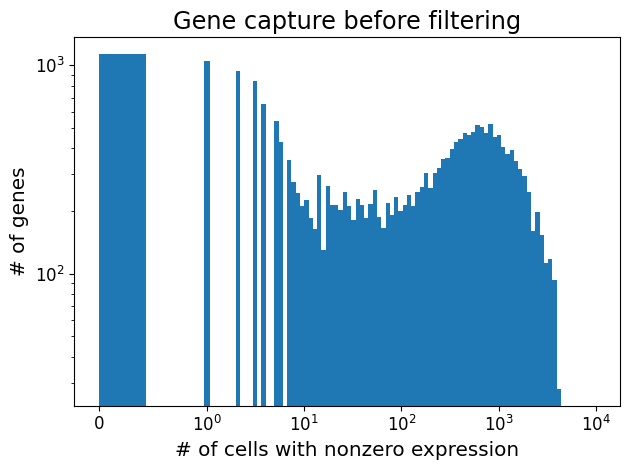

In [13]:
scprep.plot.histogram(scprep.measure.gene_capture_count(data), log=True,
                      title="Gene capture before filtering",
                     xlabel='# of cells with nonzero expression',
                     ylabel='# of genes')

<AxesSubplot:title={'center':'Gene capture before filtering'}, xlabel='number of count per gene', ylabel='number of genes'>

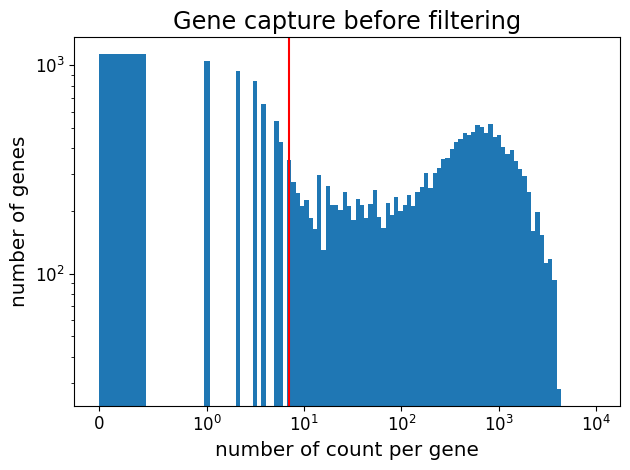

In [14]:
scprep.plot.histogram(scprep.measure.gene_capture_count(data), 
                      cutoff =(7,),
                      log=True,
                      title="Gene capture before filtering",
                     xlabel='number of count per gene',
                     ylabel='number of genes')

In [15]:
cutoff = (7,)
data = scprep.filter.filter_rare_genes(data, min_cells=cutoff)

In [16]:
data

,0610005C13Rik,0610007C21Rik,0610007L01Rik,0610007N19Rik,0610007P08Rik,0610007P14Rik,0610007P22Rik,0610009B22Rik,0610009D07Rik,0610009L18Rik,...,Zwint,Zxda,Zxdb,Zxdc,Zyg11a,Zyg11b,Zyx,Zzef1,Zzz3,l7Rn6
F8.MAA000594.3_8_M.1.1_Aorta,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
H11.MAA000594.3_8_M.1.1_Aorta,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,281.0,0.0,0.0
A22.MAA000594.3_8_M.1.1_Aorta,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1313.0,1.0
H12.MAA000594.3_8_M.1.1_Aorta,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,157.0,220.0,0.0,0.0
L9.MAA000594.3_8_M.1.1_Aorta,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
F3.MAA100097.3_38_F.1.1_Heart,0.0,66.0,150.0,11.0,8.0,0.0,0.0,73.0,66.0,8.0,...,85.0,0.0,0.0,56.0,0.0,0.0,0.0,0.0,0.0,212.0
D6.MAA100097.3_39_F.1.1_Heart,0.0,147.0,116.0,0.0,0.0,0.0,0.0,157.0,106.0,0.0,...,93.0,0.0,0.0,113.0,0.0,123.0,0.0,0.0,193.0,23.0
F1.MAA100097.3_38_F.1.1_Heart,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A9.MAA100097.3_39_F.1.1_Heart,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


#### II.3) Normalization 

<AxesSubplot:title={'center':'Library size before normalization'}, xlabel='Library size', ylabel='Number of cells'>

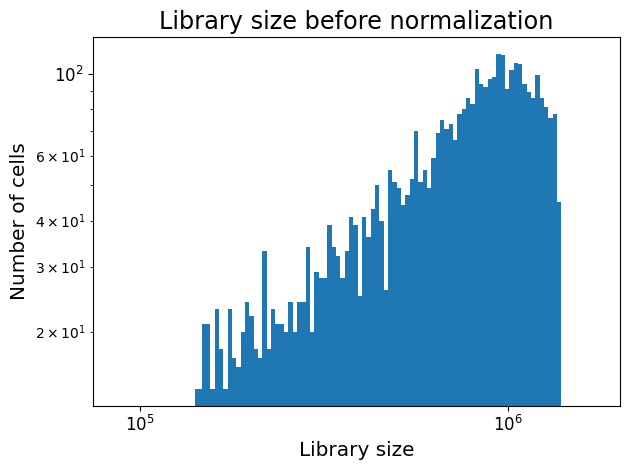

In [17]:
scprep.plot.plot_library_size(data, title='Library size before normalization')

In [18]:
data, metadata['library_size'] = scprep.normalize.library_size_normalize(data, return_library_size=True)

<AxesSubplot:title={'center':'Library size after normalization'}, xlabel='Library size', ylabel='Number of cells'>

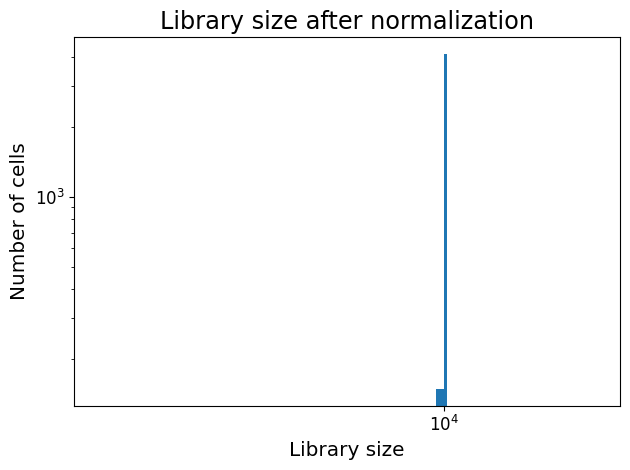

In [19]:
scprep.plot.plot_library_size(data, title='Library size after normalization')

#### II.4) Gene count transformation 

<AxesSubplot:title={'center':'gene mean expression before transformation'}, xlabel='mean expression', ylabel='gene counts'>

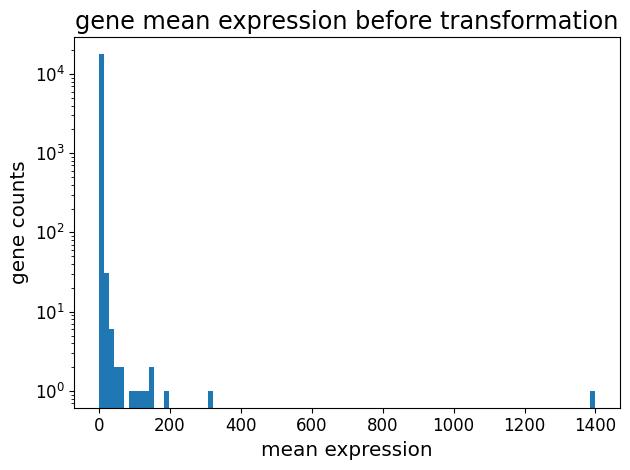

In [20]:
scprep.plot.histogram(data.mean(axis=0), log='y',
                      title= "gene mean expression before transformation",
                     xlabel= "mean expression",
                     ylabel= "gene counts")

In [21]:
data = scprep.transform.sqrt(data) 

The square root act as a logarithm but prevent from the apparition of negative value or infinite value due to small values. 

<AxesSubplot:title={'center':'gene mean expression after transformation'}, xlabel='mean expression', ylabel='gene counts'>

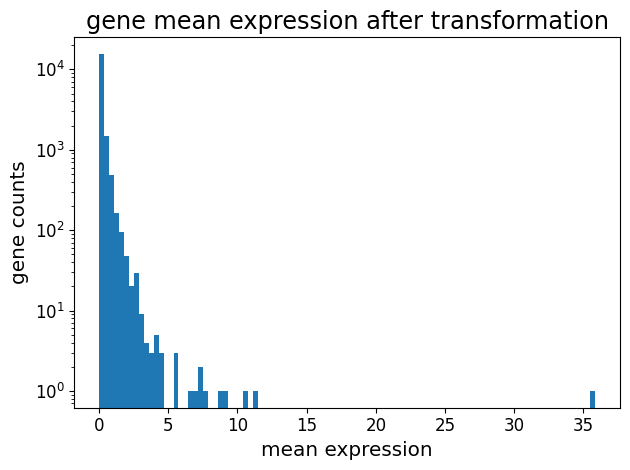

In [22]:
scprep.plot.histogram(data.mean(axis=0), log='y',
                      title= "gene mean expression after transformation",
                     xlabel= "mean expression",
                     ylabel= "gene counts")

#### II.5) Data saving

In [23]:
data.to_pickle("data.pickle.gz")
metadata.to_pickle("metadata.pickle.gz")  
annotation.to_pickle("annotation.pickle.gz")

## NB: if III has already been run once, please jump to part IV. 

# III Projection technique: PCA vs UMAP vs tSNE

In [2]:
%%bash
#run this everytime you restart your kernel or relaunch the server
pip install scprep
pip install umap-learn
pip install phate 
pip install phenograph
pip install tasklogger 
pip install harmonypy

In [11]:
import pandas as pd
import numpy as np
import scprep, umap 
import umap.umap_ as umap

import sklearn
import sklearn.cluster
import sklearn.manifold
import graphtools as gt
import phenograph
import matplotlib.pyplot as plt
import tasklogger

import harmonypy as hm

%matplotlib inline

In [4]:
data = pd.read_pickle("data.pickle.gz")
metadata = pd.read_pickle("metadata.pickle.gz")
annotation = pd.read_pickle("annotation.pickle.gz")

#### III.1) PCA

In [5]:
data_pca = scprep.reduce.pca(data, n_components=50, method='dense')

In [12]:
metadata

,plate.barcode,mouse.id,tissue,subtissue,FACS.selection,mouse.sex,library_size
F8.MAA000594.3_8_M.1.1_Aorta,MAA000594,3_8_M,Heart,Aorta,Viable,M,120846.0
H11.MAA000594.3_8_M.1.1_Aorta,MAA000594,3_8_M,Heart,Aorta,Viable,M,368522.0
A22.MAA000594.3_8_M.1.1_Aorta,MAA000594,3_8_M,Heart,Aorta,Viable,M,327737.0
H12.MAA000594.3_8_M.1.1_Aorta,MAA000594,3_8_M,Heart,Aorta,Viable,M,353078.0
L9.MAA000594.3_8_M.1.1_Aorta,MAA000594,3_8_M,Heart,Aorta,Viable,M,223657.0
...,...,...,...,...,...,...,...
F3.MAA100097.3_38_F.1.1_Heart,MAA100097,3_38_F/3_39_F,Heart,LA/RA,cardiomyocytes,F,768718.0
D6.MAA100097.3_39_F.1.1_Heart,MAA100097,3_38_F/3_39_F,Heart,LA/RA,cardiomyocytes,F,1273616.0
F1.MAA100097.3_38_F.1.1_Heart,MAA100097,3_38_F/3_39_F,Heart,LA/RA,cardiomyocytes,F,265634.0
A9.MAA100097.3_39_F.1.1_Heart,MAA100097,3_38_F/3_39_F,Heart,LA/RA,cardiomyocytes,F,454655.0


In [9]:
annotation

,Neurog3>0_raw,Neurog3>0_scaled,cell_ontology_class,cell_ontology_id,cluster.ids,free_annotation,mouse.id,mouse.sex,plate.barcode,subsetA,...,subsetC,subsetC_cluster.ids,subsetD,subsetD_cluster.ids,subsetE,subsetE_cluster.ids,subtissue,tissue,tissue_tSNE_1,tissue_tSNE_2
F8.MAA000594.3_8_M.1.1_Aorta,NaN,NaN,erythrocyte,CL:0000232,0,NaN,3_8_M,M,MAA000594,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Aorta,7.898756,-6.459818
H11.MAA000594.3_8_M.1.1_Aorta,NaN,NaN,erythrocyte,CL:0000232,0,NaN,3_8_M,M,MAA000594,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Aorta,14.039970,-3.910648
A22.MAA000594.3_8_M.1.1_Aorta,NaN,NaN,professional antigen presenting cell,CL:0000145,4,NaN,3_8_M,M,MAA000594,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Aorta,4.430509,-14.694117
H12.MAA000594.3_8_M.1.1_Aorta,NaN,NaN,erythrocyte,CL:0000232,0,NaN,3_8_M,M,MAA000594,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Aorta,11.292782,0.084976
L9.MAA000594.3_8_M.1.1_Aorta,NaN,NaN,erythrocyte,CL:0000232,0,NaN,3_8_M,M,MAA000594,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Aorta,14.445176,-6.423835
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
F3.MAA100097.3_38_F.1.1_Heart,NaN,NaN,cardiac muscle cell,CL:0000746,9,NaN,3_38_F/3_39_F,F,MAA100097,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,LA/RA,Heart,-6.201939,34.128409
D6.MAA100097.3_39_F.1.1_Heart,NaN,NaN,cardiac muscle cell,CL:0000746,9,NaN,3_38_F/3_39_F,F,MAA100097,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,LA/RA,Heart,-6.210515,35.822128
F1.MAA100097.3_38_F.1.1_Heart,NaN,NaN,cardiac muscle cell,CL:0000746,9,NaN,3_38_F/3_39_F,F,MAA100097,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,LA/RA,Heart,-6.652750,33.126087
A9.MAA100097.3_39_F.1.1_Heart,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


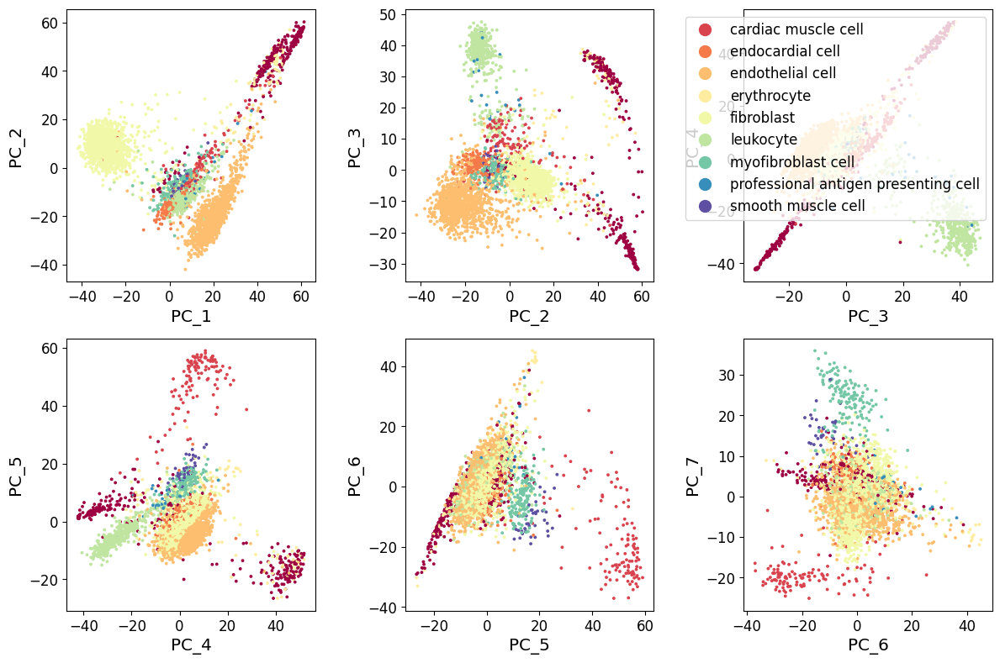

In [10]:
fig, axes = plt.subplots(2,3, figsize=(12,8))
axes = axes.flatten()

for i, ax in enumerate(axes):
    # only plot a legend on one axis
    legend = True if i == 2 else False
    scprep.plot.scatter(data_pca.iloc[:,i], data_pca.iloc[:,i+1], c=annotation['cell_ontology_class'],
                        cmap='Spectral', ax=ax,
                        xlabel="PC_" + str(i+1), ylabel="PC_" + str(i+2), legend=legend)
fig.tight_layout() 

In PCA, the most satisfying principle component are the two first one as they keep track of the most important variance between the different gene and different cells. It can also be noticed that clusters are more distinct with those two first component. 
As the goal of this party is to compare PCA to UMAP to tSNE, no further plot will be shown with other mapping coloration issued from metadata or annotation. 

#### III.2) UMAP vs UMAP (PCA fed)
In this party, in addition to observe how efficient the UMAP method is in term of clustering, a comparison is made between UMAP directly launch on the raw data filtered vs the data reduce by the PCA analysis. 

In [20]:
data_umap = umap.UMAP().fit_transform(data)
data_umap = pd.DataFrame(data_umap, index = data.index)

In [21]:
data_umap_pca_fed = umap.UMAP().fit_transform(data_pca)
data_umap_pca_fed = pd.DataFrame(data_umap_pca_fed, index = data.index)

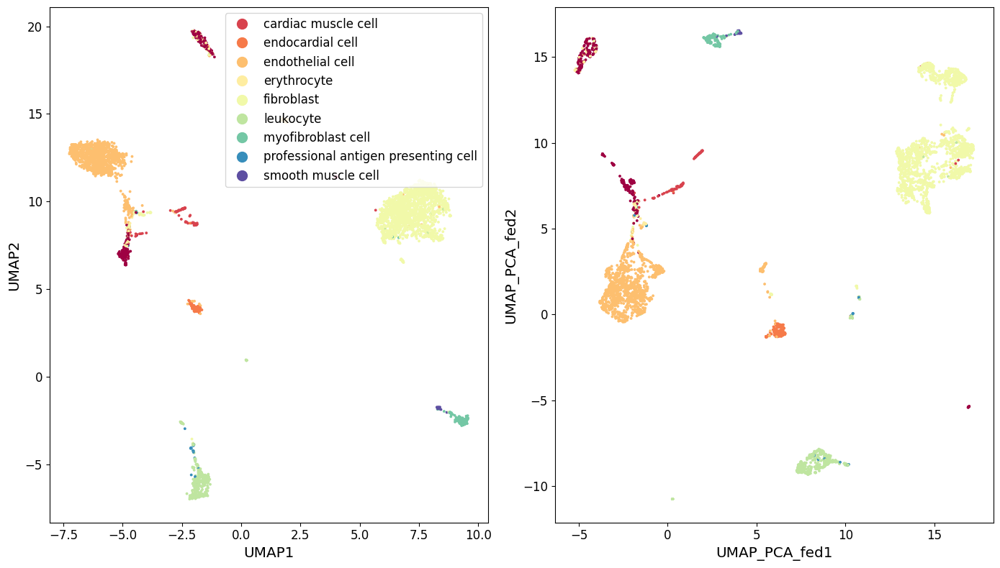

In [51]:
fig, (ax1, ax2) = plt.subplots(1,2,figsize=(14,8))


scprep.plot.scatter2d(data_umap, c=annotation['cell_ontology_class'], ax=ax1, cmap='Spectral', label_prefix="UMAP",legend=True)
scprep.plot.scatter2d(data_umap_pca_fed, c=annotation['cell_ontology_class'], ax=ax2, cmap='Spectral', label_prefix="UMAP_PCA_fed",legend=False)
fig.tight_layout() 

Here, no clear distinction can be made between UMAP and UMAP PCA fed. If a remark may however be made, a noticeable trait is that the clusers in the UMAP (PCA fed), are somewhat differentiated into subclusters. 
Two interpretation can therefore be made: 
-Either the UMAP (PCA fed) gives more informations and should be kept
-Either those additional informations are not correlated to any biological distinction and it may induce biased in further interprerations. 

As in litterature, people usually feed UMAP with PCA so it get faster, the UMAP (PCA fed) method will be kept. 

#### III.3) tSNE vs tSNE (PCA fed)
To use tSNE, this tutorial has been used: https://github.com/KrishnaswamyLab/SingleCellWorkshop/blob/master/Visualizing_retinal_bipolar_dataset_revised_notebook.ipynb
In this party as well, in addition to observe how efficient the tSNE method is in term of clustering, a comparison is made between tSNE directly launch on the raw data filtered vs the data reduce by the PCA analysis.

In [49]:
tsne_op = sklearn.manifold.TSNE(n_components = 2, perplexity = 40)
data_tsne = tsne_op.fit_transform(data)
data_tsne = pd.DataFrame(data_tsne, index = data.index)

/srv/conda/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/srv/conda/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


In [40]:
tsne_op = sklearn.manifold.TSNE(n_components = 2, perplexity = 40)
data_tsne_pca_fed = tsne_op.fit_transform(data_pca)
data_tsne_pca_fed = pd.DataFrame(data_tsne_pca_fed, index = data.index)

/srv/conda/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/srv/conda/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


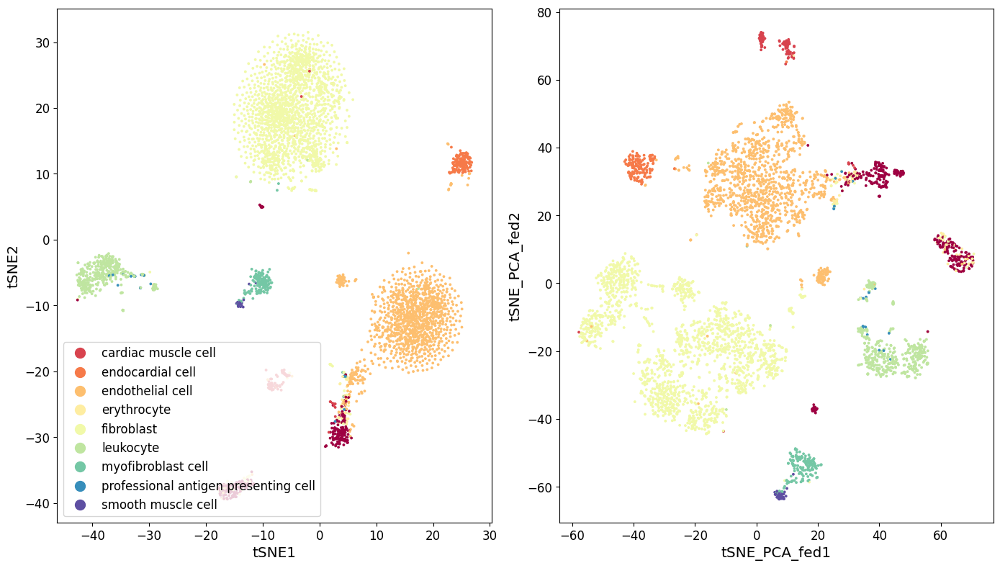

In [53]:
fig, (ax1, ax2) = plt.subplots(1,2,figsize=(14,8))


scprep.plot.scatter2d(data_tsne, c=annotation['cell_ontology_class'], ax=ax1, cmap='Spectral', label_prefix="tSNE",legend=True)
scprep.plot.scatter2d(data_tsne_pca_fed, c=annotation['cell_ontology_class'], ax=ax2, cmap='Spectral', label_prefix="tSNE_PCA_fed",legend=False)
fig.tight_layout() 

Here, similar inteppretation can be made with tSNE than with UMAP. For the same reasons evoked with UMAP, tSNE (PCA fed) is kept. 

#### III.4) Overall comparisons

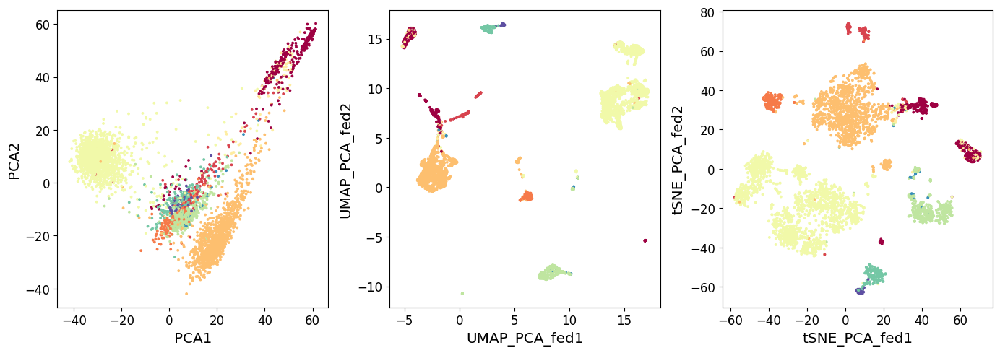

In [63]:
fig, (ax1, ax2, ax3) = plt.subplots(1,3,figsize=(14,5))


scprep.plot.scatter2d(data_pca.iloc[:,:2], c=annotation['cell_ontology_class'], ax=ax1, cmap='Spectral', label_prefix="PCA",legend=False)
scprep.plot.scatter2d(data_umap_pca_fed, c=annotation['cell_ontology_class'], ax=ax2, cmap='Spectral', label_prefix="UMAP_PCA_fed",legend=False)
scprep.plot.scatter2d(data_tsne_pca_fed, c=annotation['cell_ontology_class'], ax=ax3, cmap='Spectral', label_prefix="tSNE_PCA_fed",legend=False)
fig.tight_layout() 


For the sake of visibility, no legend has been set. The legend is however the same than the one in the previous plot. 
It can be infered at the sight of these plots that the tSNE PCA fed method is the most satisfying one in term of clustering. 
It will be the one prefered for the further step of this project. 

#### III.5) Data saving

In [64]:
data_pca.to_pickle("data_pca.pickle.gz")
data_umap_pca_fed.to_pickle("data_umap_pca_fed.pickle.gz")  
data_tsne_pca_fed.to_pickle("data_tsne_pca_fed.pickle.gz")

## NB: if IV has already been run once, please jump to part V. 

# IV Batch effect
To correct the batch effect, this introduction to batch effect has been used:
https://www.10xgenomics.com/resources/analysis-guides/introduction-batch-effect-correction

In particular, the harmonypy tutorial has been used: 
https://github.com/slowkow/harmonypy

#### IV.1) Data loading

In [1]:
%%bash
#run this everytime you restart your kernel or relaunch the server
pip install scprep
pip install umap-learn
pip install phate 
pip install phenograph
pip install tasklogger 
pip install harmonypy

  Using cached scprep-1.2.3-py3-none-any.whl (94 kB)
  Using cached umap_learn-0.5.5-py3-none-any.whl
  Using cached numba-0.58.1-cp39-cp39-manylinux2014_x86_64.manylinux_2_17_x86_64.whl (3.6 MB)
  Using cached pynndescent-0.5.11-py3-none-any.whl (55 kB)
  Using cached llvmlite-0.41.1-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (43.6 MB)
  Using cached phate-1.0.11-py3-none-any.whl (23 kB)
  Using cached s_gd2-1.8.1-cp39-cp39-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_12_x86_64.manylinux2010_x86_64.whl (417 kB)
  Using cached tasklogger-1.2.0-py3-none-any.whl (14 kB)
  Using cached graphtools-1.5.3-py3-none-any.whl (45 kB)
  Using cached Deprecated-1.2.14-py2.py3-none-any.whl (9.6 kB)
  Using cached PyGSP-0.5.1-py2.py3-none-any.whl (1.8 MB)
  Using cached wrapt-1.16.0-cp39-cp39-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_17_x86_64.manylinux2014_x86_64.whl (80 kB)
  Using cached PhenoGraph-1.5.7-py3-none-any.whl (159 kB)
  Using cached leidenalg-0.10.1-cp38-a

In [2]:
import pandas as pd
import numpy as np
import scprep, umap 
import umap.umap_ as umap

import sklearn
import sklearn.cluster
import sklearn.manifold
import graphtools as gt
import phenograph
import matplotlib.pyplot as plt
import tasklogger

import harmonypy as hm

%matplotlib inline

In [3]:
data = pd.read_pickle("data.pickle.gz")
metadata = pd.read_pickle("metadata.pickle.gz")
annotation = pd.read_pickle("annotation.pickle.gz")

data_pca = pd.read_pickle("data_pca.pickle.gz")
data_umap_pca_fed = pd.read_pickle("data_umap_pca_fed.pickle.gz")  
data_tsne_pca_fed = pd.read_pickle("data_tsne_pca_fed.pickle.gz")

#### IV.2) Batch effect correction on data already reduced by PCA, UMAP (PCA fed) and tSNE (PCA fed)

In [4]:
vars_use=['plate.barcode']

ho_pca = hm.run_harmony(data_pca, metadata, vars_use)
data_pca_batch_corrected = pd.DataFrame(ho_pca.Z_corr).transpose()
data_pca_batch_corrected.index=data.index

ho_umap_pca_fed = hm.run_harmony(data_umap_pca_fed, metadata, vars_use)
data_umap_pca_fed_batch_corrected = pd.DataFrame(ho_umap_pca_fed.Z_corr).transpose()
data_umap_pca_fed_batch_corrected.index=data.index

ho_tsne_pca_fed = hm.run_harmony(data_tsne_pca_fed, metadata, vars_use)
data_tsne_pca_fed_batch_corrected = pd.DataFrame(ho_tsne_pca_fed.Z_corr).transpose()
data_tsne_pca_fed_batch_corrected.index=data.index

2023-12-14 04:21:04,785 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2023-12-14 04:21:08,005 - harmonypy - INFO - sklearn.KMeans initialization complete.
2023-12-14 04:21:08,072 - harmonypy - INFO - Iteration 1 of 10
2023-12-14 04:21:12,609 - harmonypy - INFO - Iteration 2 of 10
2023-12-14 04:21:17,361 - harmonypy - INFO - Iteration 3 of 10
2023-12-14 04:21:22,210 - harmonypy - INFO - Iteration 4 of 10
2023-12-14 04:21:27,177 - harmonypy - INFO - Iteration 5 of 10
2023-12-14 04:21:31,069 - harmonypy - INFO - Iteration 6 of 10
2023-12-14 04:21:36,172 - harmonypy - INFO - Converged after 6 iterations
2023-12-14 04:21:36,202 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2023-12-14 04:21:36,805 - harmonypy - INFO - sklearn.KMeans initialization complete.
2023-12-14 04:21:36,847 - harmonypy - INFO - Iteration 1 of 10
2023-12-14 04:21:41,075 - harmonypy - INFO - Iteration 2 of 10
2023-12-14 04:21:45,600 - harmonypy - INFO - Iteration 3 of 

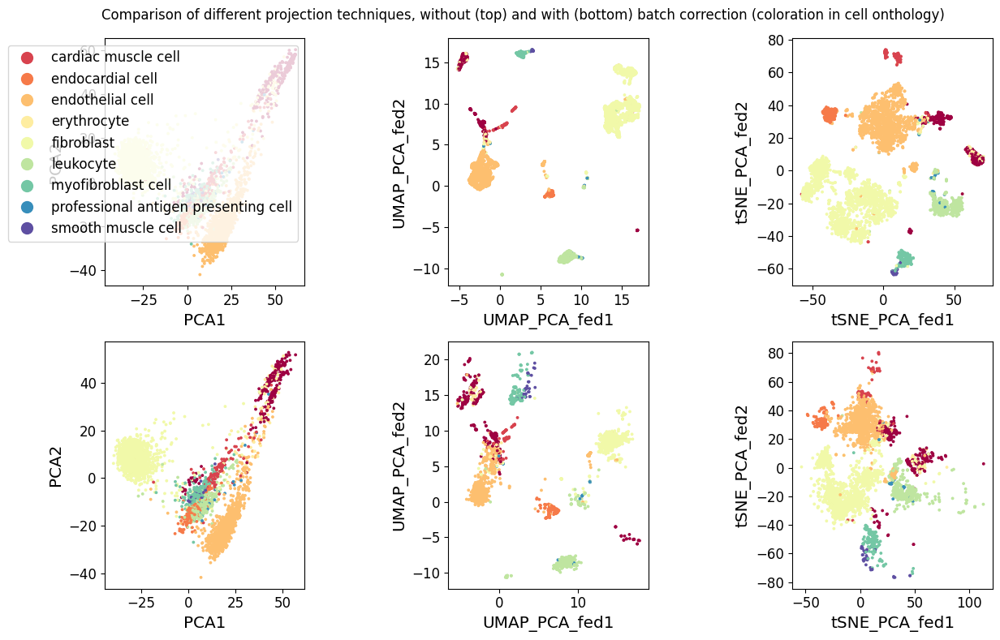

In [11]:
fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2,3,figsize=(12,8))


scprep.plot.scatter2d(data_pca.iloc[:,:2], c=annotation['cell_ontology_class'], ax=ax1, cmap='Spectral', label_prefix="PCA",legend=True)
scprep.plot.scatter2d(data_umap_pca_fed, c=annotation['cell_ontology_class'], ax=ax2, cmap='Spectral', label_prefix="UMAP_PCA_fed",legend=False)
scprep.plot.scatter2d(data_tsne_pca_fed, c=annotation['cell_ontology_class'], ax=ax3, cmap='Spectral', label_prefix="tSNE_PCA_fed",legend=False)

scprep.plot.scatter2d(data_pca_batch_corrected.iloc[:,:2], c=annotation['cell_ontology_class'], ax=ax4, cmap='Spectral', label_prefix="PCA",legend=False)
scprep.plot.scatter2d(data_umap_pca_fed_batch_corrected, c=annotation['cell_ontology_class'], ax=ax5, cmap='Spectral', label_prefix="UMAP_PCA_fed",legend=False)
scprep.plot.scatter2d(data_tsne_pca_fed_batch_corrected, c=annotation['cell_ontology_class'], ax=ax6, cmap='Spectral', label_prefix="tSNE_PCA_fed",legend=False)

fig.suptitle('Comparison of different projection techniques, without (top) and with (bottom) batch correction (coloration in cell onthology)')
fig.tight_layout() 


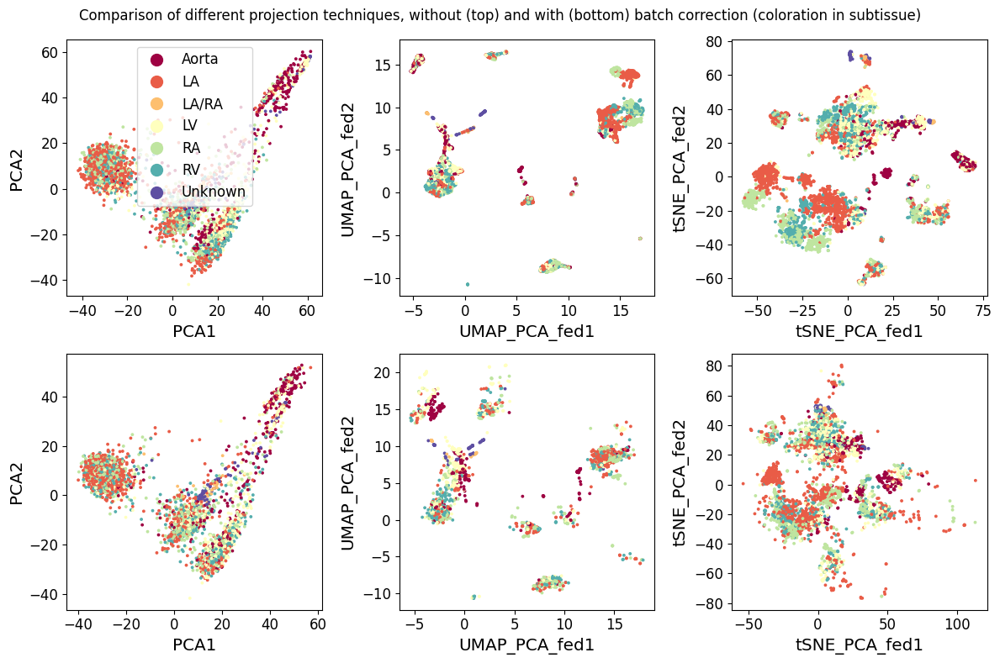

In [12]:
fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2,3,figsize=(12,8))


scprep.plot.scatter2d(data_pca.iloc[:,:2], c=metadata['subtissue'], ax=ax1, cmap='Spectral', label_prefix="PCA",legend=True)
scprep.plot.scatter2d(data_umap_pca_fed, c=metadata['subtissue'], ax=ax2, cmap='Spectral', label_prefix="UMAP_PCA_fed",legend=False)
scprep.plot.scatter2d(data_tsne_pca_fed, c=metadata['subtissue'], ax=ax3, cmap='Spectral', label_prefix="tSNE_PCA_fed",legend=False)

scprep.plot.scatter2d(data_pca_batch_corrected.iloc[:,:2], c=metadata['subtissue'], ax=ax4, cmap='Spectral', label_prefix="PCA",legend=False)
scprep.plot.scatter2d(data_umap_pca_fed_batch_corrected, c=metadata['subtissue'], ax=ax5, cmap='Spectral', label_prefix="UMAP_PCA_fed",legend=False)
scprep.plot.scatter2d(data_tsne_pca_fed_batch_corrected, c=metadata['subtissue'], ax=ax6, cmap='Spectral', label_prefix="tSNE_PCA_fed",legend=False)

fig.suptitle('Comparison of different projection techniques, without (top) and with (bottom) batch correction (coloration in subtissue)')
fig.tight_layout() 


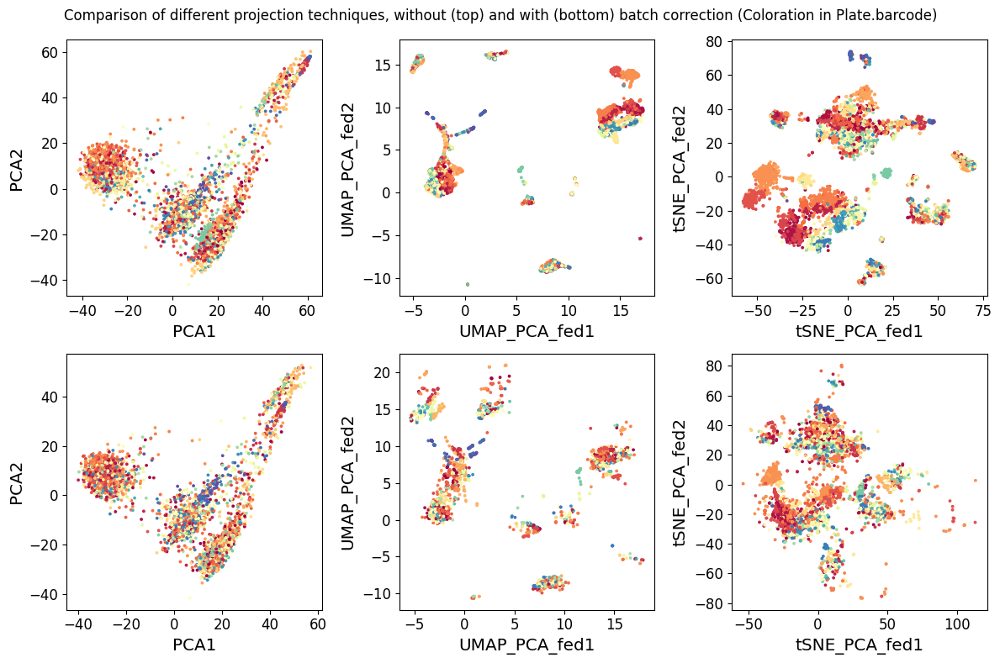

In [8]:
fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2,3,figsize=(12,8))


scprep.plot.scatter2d(data_pca.iloc[:,:2], c=metadata['plate.barcode'], ax=ax1, cmap='Spectral', label_prefix="PCA",legend=False)
scprep.plot.scatter2d(data_umap_pca_fed, c=metadata['plate.barcode'], ax=ax2, cmap='Spectral', label_prefix="UMAP_PCA_fed",legend=False)
scprep.plot.scatter2d(data_tsne_pca_fed, c=metadata['plate.barcode'], ax=ax3, cmap='Spectral', label_prefix="tSNE_PCA_fed",legend=False)

scprep.plot.scatter2d(data_pca_batch_corrected.iloc[:,:2], c=metadata['plate.barcode'], ax=ax4, cmap='Spectral', label_prefix="PCA",legend=False)
scprep.plot.scatter2d(data_umap_pca_fed_batch_corrected, c=metadata['plate.barcode'], ax=ax5, cmap='Spectral', label_prefix="UMAP_PCA_fed",legend=False)
scprep.plot.scatter2d(data_tsne_pca_fed_batch_corrected, c=metadata['plate.barcode'], ax=ax6, cmap='Spectral', label_prefix="tSNE_PCA_fed",legend=False)

fig.suptitle('Comparison of different projection techniques, without (top) and with (bottom) batch correction (Coloration in Plate.barcode)')
fig.tight_layout() 


Here the first two plots: Cell onthology and subtissue have been done to measure the lose of information in term of biological signification. The last plot in Plate.barcode is to measure how well the different batch are mixed within the cluster. 

The batch effect correction must account for the differences induced by the fact that some cells are issue from different plate, which may means different day of experiment, different mice, or all others experimental difference which differ from biological reasons. As expected, clusters have collapsed, and get closer from each other as differences induced by batch are removed. 
Even though, it looks rational to correct the batch effect considering the last plot in plate barcode where a better mix of each batch can be seen, here it seems that a lot of information is lost. If tSNE (PCA fed) was kept at first, it cannot be disqualified to the benefit of tSNE (PCA fed, batch corrected). Both will be kept. 

#### IV.3) Another approach: Batch effect correction on raw data and then reduction by PCA, UMAP (PCA fed) and tSNE (PCA fed)

In [5]:
vars_use=['plate.barcode']

ho = hm.run_harmony(data, metadata, vars_use)
data_batch_corrected = pd.DataFrame(ho.Z_corr).transpose()
data_batch_corrected.index=data.index

2023-12-14 04:22:08,015 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2023-12-14 04:24:54,038 - harmonypy - INFO - sklearn.KMeans initialization complete.
2023-12-14 04:24:54,501 - harmonypy - INFO - Iteration 1 of 10
2023-12-14 04:26:42,371 - harmonypy - INFO - Iteration 2 of 10
2023-12-14 04:28:21,075 - harmonypy - INFO - Iteration 3 of 10
2023-12-14 04:29:49,488 - harmonypy - INFO - Converged after 3 iterations


In [6]:
data_batch_corrected_pca = scprep.reduce.pca(data_batch_corrected, n_components=50, method='dense')

data_batch_corrected_umap_pca_fed = umap.UMAP().fit_transform(data_batch_corrected_pca)
data_batch_corrected_umap_pca_fed = pd.DataFrame(data_batch_corrected_umap_pca_fed, index = data.index)

tsne_op = sklearn.manifold.TSNE(n_components = 2, perplexity = 40)
data_batch_corrected_tsne_pca_fed = tsne_op.fit_transform(data_batch_corrected_pca)
data_batch_corrected_tsne_pca_fed = pd.DataFrame(data_batch_corrected_tsne_pca_fed, index = data.index)

/srv/conda/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/srv/conda/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


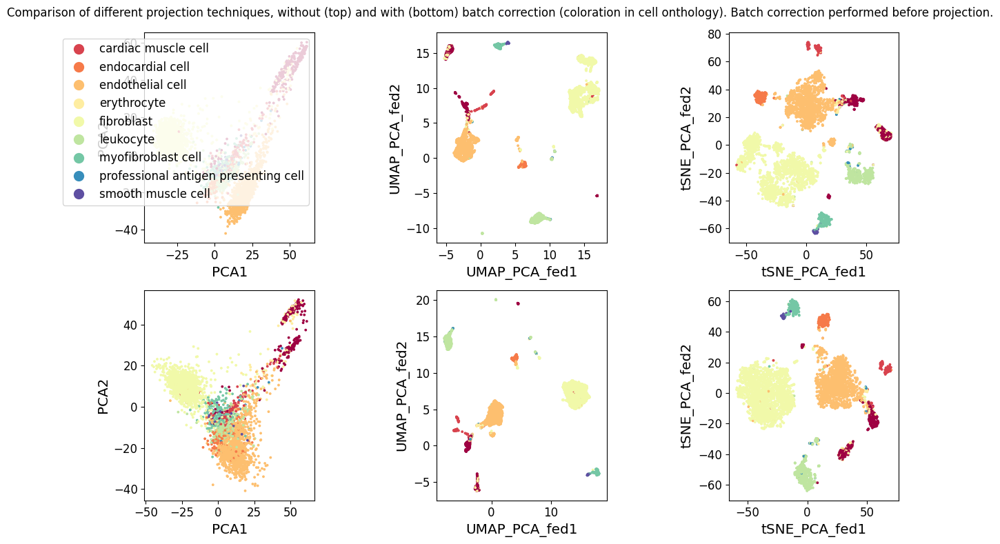

In [13]:
fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2,3,figsize=(12,8))


scprep.plot.scatter2d(data_pca.iloc[:,:2], c=annotation['cell_ontology_class'], ax=ax1, cmap='Spectral', label_prefix="PCA",legend=True)
scprep.plot.scatter2d(data_umap_pca_fed, c=annotation['cell_ontology_class'], ax=ax2, cmap='Spectral', label_prefix="UMAP_PCA_fed",legend=False)
scprep.plot.scatter2d(data_tsne_pca_fed, c=annotation['cell_ontology_class'], ax=ax3, cmap='Spectral', label_prefix="tSNE_PCA_fed",legend=False)

scprep.plot.scatter2d(data_batch_corrected_pca.iloc[:,:2], c=annotation['cell_ontology_class'], ax=ax4, cmap='Spectral', label_prefix="PCA",legend=False)
scprep.plot.scatter2d(data_batch_corrected_umap_pca_fed, c=annotation['cell_ontology_class'], ax=ax5, cmap='Spectral', label_prefix="UMAP_PCA_fed",legend=False)
scprep.plot.scatter2d(data_batch_corrected_tsne_pca_fed, c=annotation['cell_ontology_class'], ax=ax6, cmap='Spectral', label_prefix="tSNE_PCA_fed",legend=False)

fig.suptitle('Comparison of different projection techniques, without (top) and with (bottom) batch correction (coloration in cell onthology). Batch correction performed before projection.')
fig.tight_layout() 


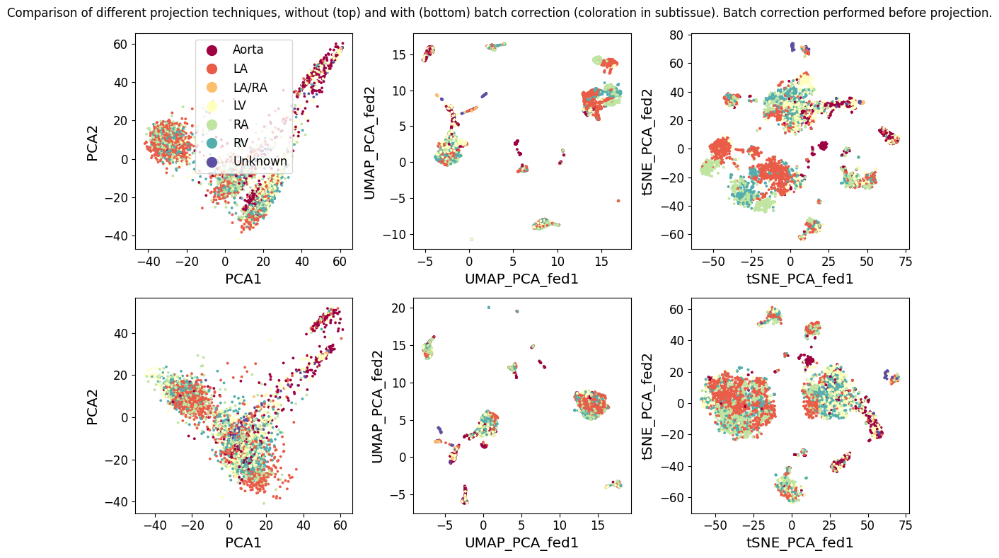

In [14]:
fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2,3,figsize=(12,8))


scprep.plot.scatter2d(data_pca.iloc[:,:2], c=metadata['subtissue'], ax=ax1, cmap='Spectral', label_prefix="PCA",legend=True)
scprep.plot.scatter2d(data_umap_pca_fed, c=metadata['subtissue'], ax=ax2, cmap='Spectral', label_prefix="UMAP_PCA_fed",legend=False)
scprep.plot.scatter2d(data_tsne_pca_fed, c=metadata['subtissue'], ax=ax3, cmap='Spectral', label_prefix="tSNE_PCA_fed",legend=False)

scprep.plot.scatter2d(data_batch_corrected_pca.iloc[:,:2], c=metadata['subtissue'], ax=ax4, cmap='Spectral', label_prefix="PCA",legend=False)
scprep.plot.scatter2d(data_batch_corrected_umap_pca_fed, c=metadata['subtissue'], ax=ax5, cmap='Spectral', label_prefix="UMAP_PCA_fed",legend=False)
scprep.plot.scatter2d(data_batch_corrected_tsne_pca_fed, c=metadata['subtissue'], ax=ax6, cmap='Spectral', label_prefix="tSNE_PCA_fed",legend=False)

fig.suptitle('Comparison of different projection techniques, without (top) and with (bottom) batch correction (coloration in subtissue). Batch correction performed before projection.')
fig.tight_layout() 


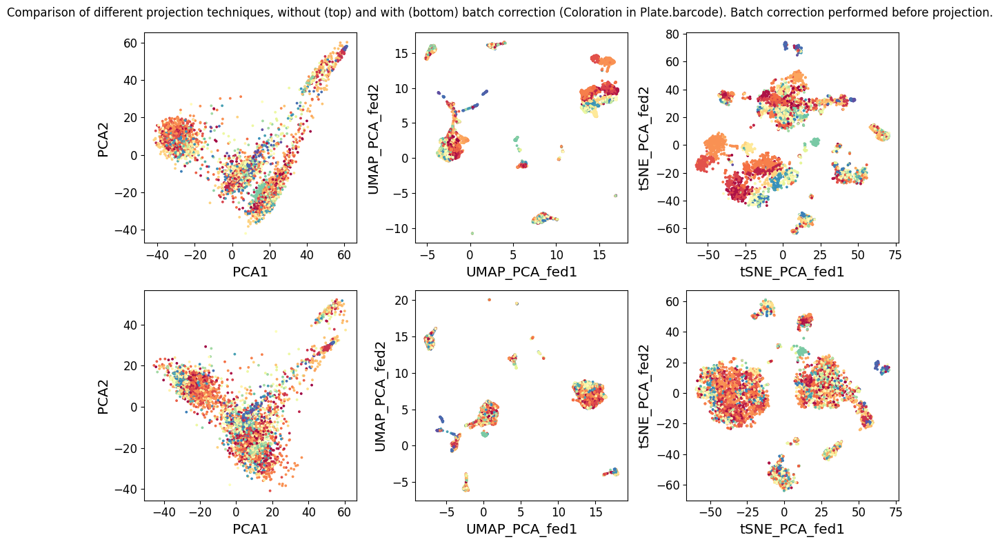

In [15]:
fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2,3,figsize=(12,8))


scprep.plot.scatter2d(data_pca.iloc[:,:2], c=metadata['plate.barcode'], ax=ax1, cmap='Spectral', label_prefix="PCA",legend=False)
scprep.plot.scatter2d(data_umap_pca_fed, c=metadata['plate.barcode'], ax=ax2, cmap='Spectral', label_prefix="UMAP_PCA_fed",legend=False)
scprep.plot.scatter2d(data_tsne_pca_fed, c=metadata['plate.barcode'], ax=ax3, cmap='Spectral', label_prefix="tSNE_PCA_fed",legend=False)

scprep.plot.scatter2d(data_batch_corrected_pca.iloc[:,:2], c=metadata['plate.barcode'], ax=ax4, cmap='Spectral', label_prefix="PCA",legend=False)
scprep.plot.scatter2d(data_batch_corrected_umap_pca_fed, c=metadata['plate.barcode'], ax=ax5, cmap='Spectral', label_prefix="UMAP_PCA_fed",legend=False)
scprep.plot.scatter2d(data_batch_corrected_tsne_pca_fed, c=metadata['plate.barcode'], ax=ax6, cmap='Spectral', label_prefix="tSNE_PCA_fed",legend=False)

fig.suptitle('Comparison of different projection techniques, without (top) and with (bottom) batch correction (Coloration in Plate.barcode). Batch correction performed before projection.')
fig.tight_layout() 


Let's now see the difference of the two batch correction: 

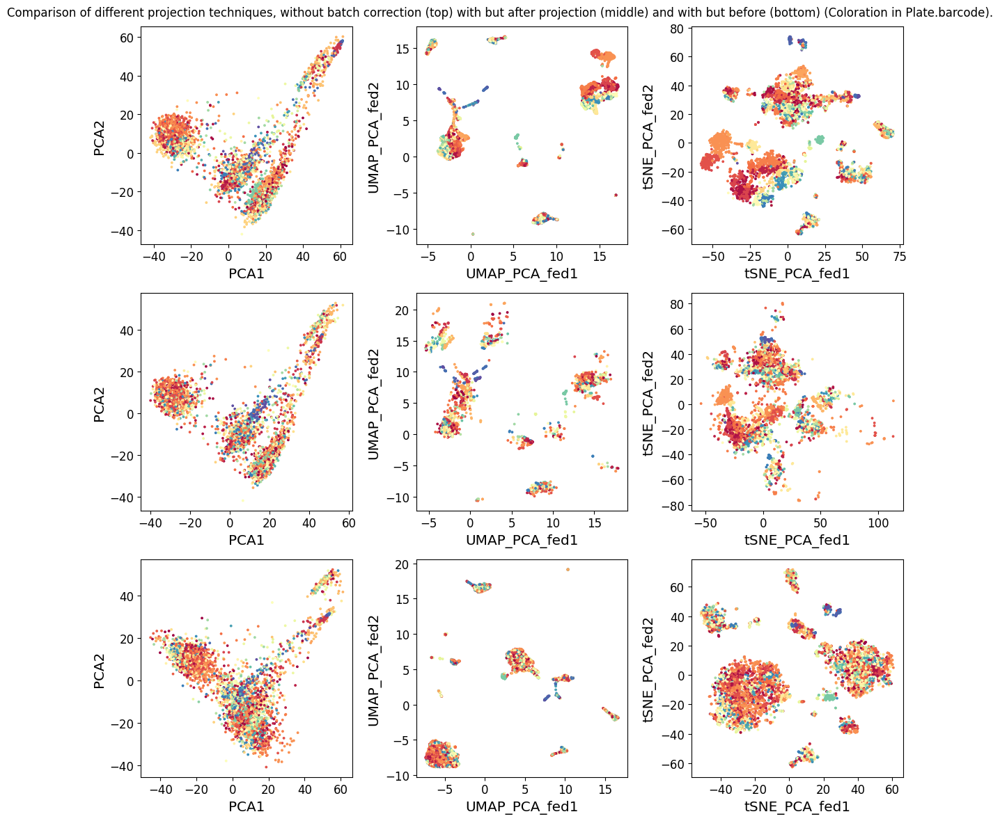

In [19]:
fig, ((ax1, ax2, ax3), (ax4, ax5, ax6),(ax7, ax8, ax9)) = plt.subplots(3,3,figsize=(12,12))

scprep.plot.scatter2d(data_pca.iloc[:,:2], c=metadata['plate.barcode'], ax=ax1, cmap='Spectral', label_prefix="PCA",legend=False)
scprep.plot.scatter2d(data_umap_pca_fed, c=metadata['plate.barcode'], ax=ax2, cmap='Spectral', label_prefix="UMAP_PCA_fed",legend=False)
scprep.plot.scatter2d(data_tsne_pca_fed, c=metadata['plate.barcode'], ax=ax3, cmap='Spectral', label_prefix="tSNE_PCA_fed",legend=False)


scprep.plot.scatter2d(data_pca_batch_corrected.iloc[:,:2], c=metadata['plate.barcode'], ax=ax4, cmap='Spectral', label_prefix="PCA",legend=False)
scprep.plot.scatter2d(data_umap_pca_fed_batch_corrected, c=metadata['plate.barcode'], ax=ax5, cmap='Spectral', label_prefix="UMAP_PCA_fed",legend=False)
scprep.plot.scatter2d(data_tsne_pca_fed_batch_corrected, c=metadata['plate.barcode'], ax=ax6, cmap='Spectral', label_prefix="tSNE_PCA_fed",legend=False)

scprep.plot.scatter2d(data_batch_corrected_pca.iloc[:,:2], c=metadata['plate.barcode'], ax=ax7, cmap='Spectral', label_prefix="PCA",legend=False)
scprep.plot.scatter2d(data_batch_corrected_umap_pca_fed, c=metadata['plate.barcode'], ax=ax8, cmap='Spectral', label_prefix="UMAP_PCA_fed",legend=False)
scprep.plot.scatter2d(data_batch_corrected_tsne_pca_fed, c=metadata['plate.barcode'], ax=ax9, cmap='Spectral', label_prefix="tSNE_PCA_fed",legend=False)

fig.suptitle('Comparison of different projection techniques, without batch correction (top) with but after projection (middle) and with but before (bottom) (Coloration in Plate.barcode).')
fig.tight_layout() 


Here as well the first two plots: Cell onthology and subtissue have been done to measure the lose of information in term of biological signification. The last plot in Plate.barcode is to measure how well the different batch are mixed within the cluster.

Doing the batch correction before performing the projection with PCA UMAP and tSNE looks to better preserve clusters. 
As considering the batch correction is important to unbiased further biological interpretation, the overall best method is: 

Filtering Data -> Batch correction -> PCA -> tSNE (PCA fed)

#### IV.4) Data saving

In [6]:
data_batch_corrected.to_pickle("data_batch_corrected.pickle.gz")
data_batch_corrected_tsne_pca_fed.to_pickle("data_batch_corrected_tsne_pca_fed.pickle.gz")

# V Clustering
#### V.1) Data loading

In [1]:
%%bash
#run this everytime you restart your kernel or relaunch the server
pip install scprep
pip install umap-learn
pip install phate 
pip install phenograph
pip install tasklogger 
pip install harmonypy

  Using cached scprep-1.2.3-py3-none-any.whl (94 kB)
  Using cached umap_learn-0.5.5-py3-none-any.whl
  Using cached numba-0.58.1-cp39-cp39-manylinux2014_x86_64.manylinux_2_17_x86_64.whl (3.6 MB)
  Using cached pynndescent-0.5.11-py3-none-any.whl (55 kB)
  Using cached llvmlite-0.41.1-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (43.6 MB)
  Using cached phate-1.0.11-py3-none-any.whl (23 kB)
  Using cached s_gd2-1.8.1-cp39-cp39-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_12_x86_64.manylinux2010_x86_64.whl (417 kB)
  Using cached graphtools-1.5.3-py3-none-any.whl (45 kB)
  Using cached tasklogger-1.2.0-py3-none-any.whl (14 kB)
  Using cached Deprecated-1.2.14-py2.py3-none-any.whl (9.6 kB)
  Using cached PyGSP-0.5.1-py2.py3-none-any.whl (1.8 MB)
  Using cached wrapt-1.16.0-cp39-cp39-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_17_x86_64.manylinux2014_x86_64.whl (80 kB)
  Using cached PhenoGraph-1.5.7-py3-none-any.whl (159 kB)
  Using cached leidenalg-0.10.1-cp38-a

In [2]:
import pandas as pd
import numpy as np
import scprep, umap 
import umap.umap_ as umap

import sklearn
import sklearn.cluster
import sklearn.manifold
import graphtools as gt
import phenograph
import matplotlib.pyplot as plt
import tasklogger

import harmonypy as hm

%matplotlib inline

In [3]:
data = pd.read_pickle("data.pickle.gz")
metadata = pd.read_pickle("metadata.pickle.gz")
annotation = pd.read_pickle("annotation.pickle.gz")

data_pca = pd.read_pickle("data_pca.pickle.gz")
data_umap_pca_fed = pd.read_pickle("data_umap_pca_fed.pickle.gz")  
data_tsne_pca_fed = pd.read_pickle("data_tsne_pca_fed.pickle.gz")

data_batch_corrected=pd.read_pickle("data_batch_corrected.pickle.gz")
data_batch_corrected_tsne_pca_fed=pd.read_pickle("data_batch_corrected_tsne_pca_fed.pickle.gz")

#### V.2) Comparison of different clustering methods, Phenograph, KMeans, Spectral

In [4]:
with tasklogger.log_task("phenograph"):
    phenograph_clusters, _, _ = phenograph.cluster(data_batch_corrected_tsne_pca_fed)

Calculating phenograph...
Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.03271961212158203 seconds
Jaccard graph constructed in 0.8871872425079346 seconds
Wrote graph to binary file in 0.183929443359375 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.91672
Louvain completed 21 runs in 1.8253698348999023 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 3.179687023162842 seconds
Calculated phenograph in 3.18 seconds.


In [5]:
with tasklogger.log_task("KMeans"):
    kmeans_clusters = sklearn.cluster.KMeans(n_clusters=7).fit_predict(data_batch_corrected_tsne_pca_fed)

Calculating KMeans...
Calculated KMeans in 0.21 seconds.


In [6]:
G = gt.Graph(data_batch_corrected_tsne_pca_fed)
G_igraph = G.to_igraph()
with tasklogger.log_task("Spectral clustering"):
    spec_op = sklearn.cluster.SpectralClustering(n_clusters=7,affinity='precomputed')
    spectral_clusters = spec_op.fit_predict(G.K)

Calculating Spectral clustering...


/srv/conda/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:259: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Calculated Spectral clustering in 12.05 seconds.


In [7]:
clusterings = {'Phenograph':phenograph_clusters,
               'KMeans':kmeans_clusters,
               'Spectral':spectral_clusters}

for alg in clusterings:
    cl_nu = scprep.utils.sort_clusters_by_values(clusterings[alg], -data_batch_corrected_tsne_pca_fed.iloc[:,0])
    clusterings[alg] = cl_nu

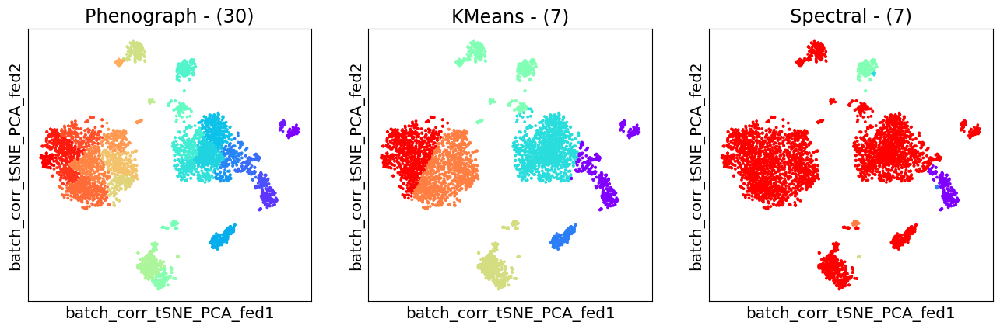

In [11]:
fig, axes = plt.subplots(1,3, figsize=(16,16), subplot_kw={'aspect':'equal'})

for ax, algorithm in zip(axes.flatten(), clusterings):
  scprep.plot.scatter2d(data_batch_corrected_tsne_pca_fed, c=clusterings[algorithm], cmap=plt.cm.rainbow,
                        title='{} - ({})'.format(algorithm, len(np.unique(clusterings[algorithm]))),
                        ticks=False, label_prefix="batch_corr_tSNE_PCA_fed", legend=False, discrete=True,
                        ax=ax)

Regarding Spectral vs KMeans, the KMeans clustering techniques is the most satisfying one as for the same cluster number, it is faster and the cluster found are more relevant. Phenograph is probably even more satisfying than KMeans, but it probably involve too many clusters. Let's therefore try to find an optimal cluster number for KMeans

#### V.3) Optimization of the KMeans method

In [12]:
from sklearn.model_selection import train_test_split
from itertools import combinations
from scipy import sparse

def get_comemberships(dat, n_clusters, model, kwargs={}):
  ## helper function
  # returns comembership matrix and model
  model = model(n_clusters=n_clusters, **kwargs)
  model.fit(dat)

  labels = model.predict(dat)
  comember = labels_to_mat(labels, n_clusters, N=dat.shape[0])

  return comember, model

def labels_to_mat(labels, n_clusters, N):
  ## helper function
  # comembership matrix helper

  # create and fill an NxN co-membership matrix
  comember = np.zeros((N, N), dtype=bool)
  for i in range(n_clusters):
    match_idx = np.where(labels==i)[0]

    # slow, memory safe (we will symmetrize + add diagonal after)
    match_idx = iter(combinations(match_idx, 2))
    for (j,k) in match_idx:
      comember[j,k] = True

  # transpose here is memory bottleneck
  comember = np.maximum(comember, comember.transpose())
  comember[np.diag_indices_from(comember)] = True

  # sparsify output for storage space
  comember = sparse.csr_matrix(comember)
  return comember

def prediction_strength(full_dat, n_clusters, n_CV=3,
                        verbose=False, model=sklearn.cluster.KMeans,
                        kwargs={}):
  test_size = 1./n_CV
  res = []
  for i in range(n_CV):
    train_dat, test_dat = train_test_split(full_dat, test_size=test_size)
    N_test = test_dat.shape[0]
    __, train_model  = get_comemberships(train_dat, n_clusters, model=model, kwargs=kwargs)
    ground_truth, __ = get_comemberships(test_dat, n_clusters, model=model, kwargs=kwargs)

    pred_labels      = labels_to_mat(train_model.predict(test_dat), n_clusters, N_test)

    # when match_count is N_test**2, there is no error
    match_count      = ground_truth.minimum(pred_labels).sum()
    res.append(match_count/(N_test**2))

  if verbose:
    print(res)

  return np.mean(res)

In [13]:
#Starting and End point of the number of clusters tested. 
start = 5
end   = 14

pred_strengths = []

for i in range(start, end):
  pred_strengths.append(prediction_strength(full_dat=data_batch_corrected_tsne_pca_fed,
                                            n_clusters=i, n_CV=3,
                        verbose=False, model=sklearn.cluster.KMeans,
                        kwargs={}))

Text(0, 0.5, 'strength')

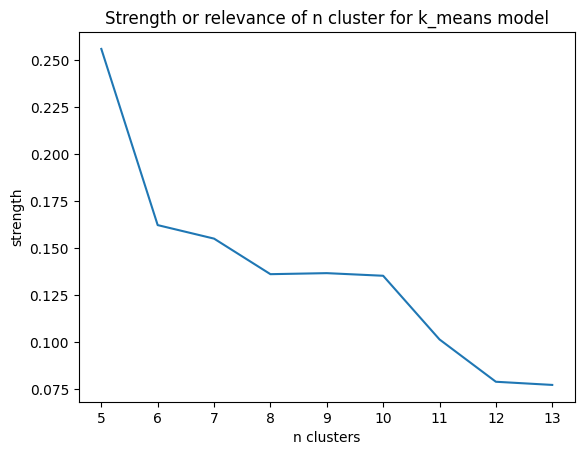

In [14]:
# plot pred_strengths to visualize the elbow curve
plt.plot([i for i in range(start, end)], pred_strengths)
plt.title("Strength or relevance of n cluster for k_means model")
plt.xlabel("n clusters")
plt.ylabel("strength")

A high prediction strength is prefered, for a large number of clusters. Thus looking at the elbow curve, the optimal n_clusters is chosen as having a high prediction strength but n_clusters+1 is much lower (falls off the plateau). Optimal_n_cluster = 10

In [8]:
optimal_n_clusters = 10
kmeans_clusters = sklearn.cluster.KMeans(n_clusters=optimal_n_clusters).fit_predict(data_batch_corrected_tsne_pca_fed)
clusterings['KMeans'] = kmeans_clusters

for alg in clusterings:
    cl_nu = scprep.utils.sort_clusters_by_values(clusterings[alg], -data_batch_corrected_tsne_pca_fed.iloc[:,0])
    clusterings[alg] = cl_nu

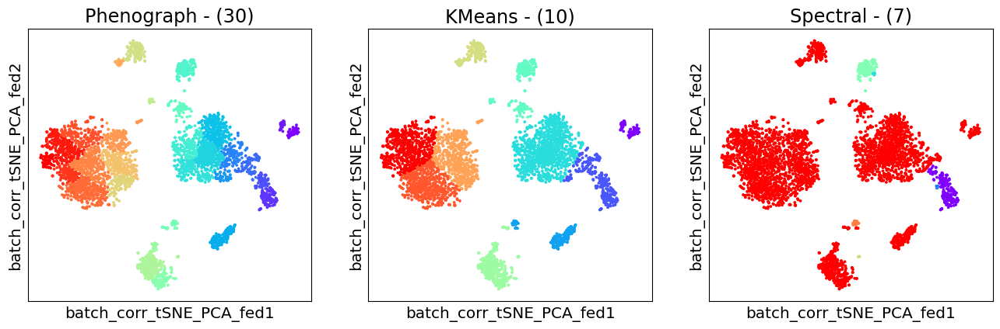

In [17]:
fig, axes = plt.subplots(1,3, figsize=(16,16), subplot_kw={'aspect':'equal'})

for ax, algorithm in zip(axes.flatten(), clusterings):
  scprep.plot.scatter2d(data_batch_corrected_tsne_pca_fed, c=clusterings[algorithm], cmap=plt.cm.rainbow,
                        title='{} - ({})'.format(algorithm, len(np.unique(clusterings[algorithm]))),
                        ticks=False, label_prefix="batch_corr_tSNE_PCA_fed", legend=False, discrete=True,
                        ax=ax)

Even though Phenograph is more satisfying in term of clustering, it may have too many clusters leading to non sense in term of biological interpretation. KMeans with the optimal n_cluster parameter is therefore prefered for further analysis. 

Let's however quantify how similar / different these methods are using a scoring method. 

#### V.4) Quantitative comparison of each methods

In [18]:
all_clusterings = []
all_algorithms = list(clusterings.keys())
for algo in all_algorithms:
    all_clusterings.append(clusterings[algo])
all_clusterings = np.vstack(all_clusterings)

In [19]:
from scipy.spatial.distance import pdist, squareform
cluster_similarities = squareform(pdist(all_clusterings, metric=sklearn.metrics.adjusted_rand_score))
# squareform assumes diagonals will be 0, but they're actually 1 because this is a similarity metric
# so we need to add 1's on the diagonal with np.eye()
cluster_similarities = cluster_similarities + np.eye(3)

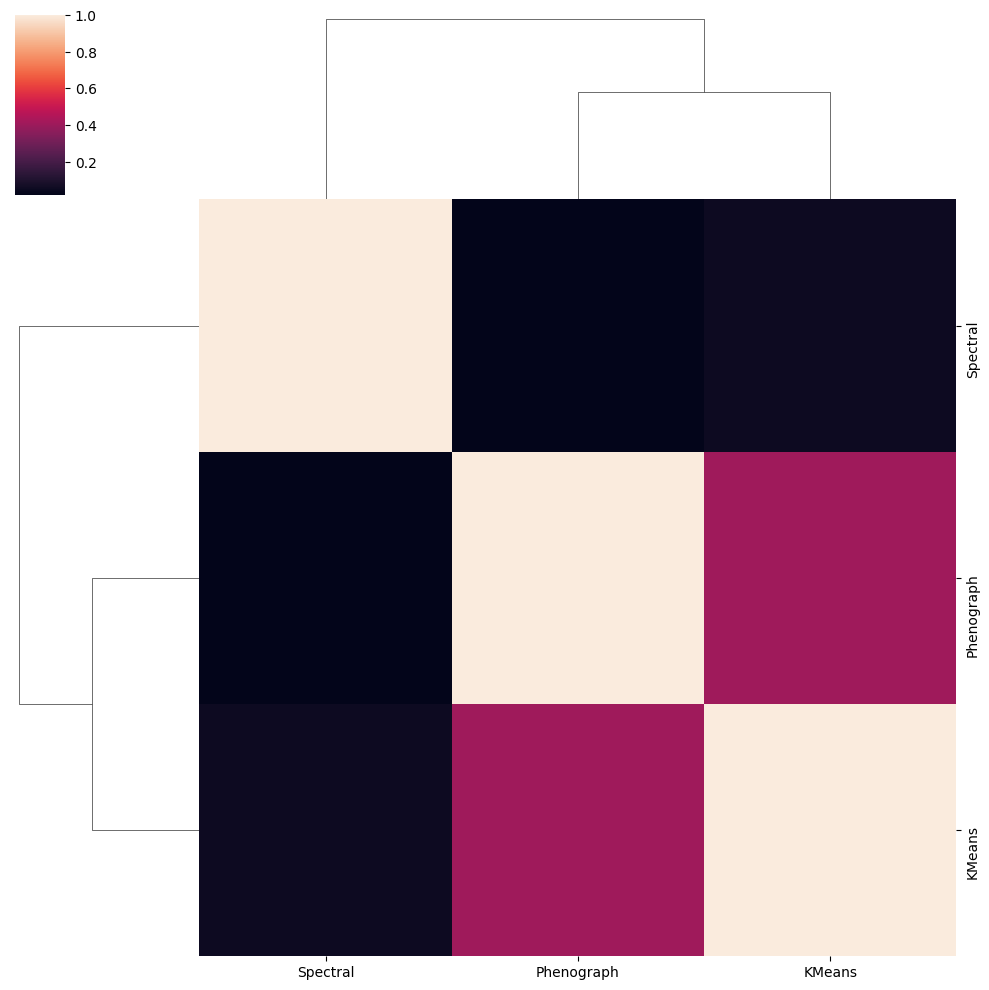

In [20]:
import seaborn as sns

sns.clustermap(cluster_similarities, xticklabels=list(clusterings.keys()), yticklabels=list(clusterings.keys()))
plt.show()

Here, a score close to 1 means that the method are very similar with each other and 0 means no similarities. This plot allow to emphasize on the fact that KMeans is similar to Phenograph in addition to have not too many cluster.
KMeans with the optimal number of cluster is the prefered method.

# VI Gene Analysis
#### VI.1) Biological known traits of clusters

In [21]:
metadata

,plate.barcode,mouse.id,tissue,subtissue,FACS.selection,mouse.sex,library_size
F8.MAA000594.3_8_M.1.1_Aorta,MAA000594,3_8_M,Heart,Aorta,Viable,M,120846.0
H11.MAA000594.3_8_M.1.1_Aorta,MAA000594,3_8_M,Heart,Aorta,Viable,M,368522.0
A22.MAA000594.3_8_M.1.1_Aorta,MAA000594,3_8_M,Heart,Aorta,Viable,M,327737.0
H12.MAA000594.3_8_M.1.1_Aorta,MAA000594,3_8_M,Heart,Aorta,Viable,M,353078.0
L9.MAA000594.3_8_M.1.1_Aorta,MAA000594,3_8_M,Heart,Aorta,Viable,M,223657.0
...,...,...,...,...,...,...,...
F3.MAA100097.3_38_F.1.1_Heart,MAA100097,3_38_F/3_39_F,Heart,LA/RA,cardiomyocytes,F,768718.0
D6.MAA100097.3_39_F.1.1_Heart,MAA100097,3_38_F/3_39_F,Heart,LA/RA,cardiomyocytes,F,1273616.0
F1.MAA100097.3_38_F.1.1_Heart,MAA100097,3_38_F/3_39_F,Heart,LA/RA,cardiomyocytes,F,265634.0
A9.MAA100097.3_39_F.1.1_Heart,MAA100097,3_38_F/3_39_F,Heart,LA/RA,cardiomyocytes,F,454655.0


In [22]:
annotation

,Neurog3>0_raw,Neurog3>0_scaled,cell_ontology_class,cell_ontology_id,cluster.ids,free_annotation,mouse.id,mouse.sex,plate.barcode,subsetA,...,subsetC,subsetC_cluster.ids,subsetD,subsetD_cluster.ids,subsetE,subsetE_cluster.ids,subtissue,tissue,tissue_tSNE_1,tissue_tSNE_2
F8.MAA000594.3_8_M.1.1_Aorta,NaN,NaN,erythrocyte,CL:0000232,0,NaN,3_8_M,M,MAA000594,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Aorta,7.898756,-6.459818
H11.MAA000594.3_8_M.1.1_Aorta,NaN,NaN,erythrocyte,CL:0000232,0,NaN,3_8_M,M,MAA000594,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Aorta,14.039970,-3.910648
A22.MAA000594.3_8_M.1.1_Aorta,NaN,NaN,professional antigen presenting cell,CL:0000145,4,NaN,3_8_M,M,MAA000594,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Aorta,4.430509,-14.694117
H12.MAA000594.3_8_M.1.1_Aorta,NaN,NaN,erythrocyte,CL:0000232,0,NaN,3_8_M,M,MAA000594,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Aorta,11.292782,0.084976
L9.MAA000594.3_8_M.1.1_Aorta,NaN,NaN,erythrocyte,CL:0000232,0,NaN,3_8_M,M,MAA000594,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Aorta,14.445176,-6.423835
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
F3.MAA100097.3_38_F.1.1_Heart,NaN,NaN,cardiac muscle cell,CL:0000746,9,NaN,3_38_F/3_39_F,F,MAA100097,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,LA/RA,Heart,-6.201939,34.128409
D6.MAA100097.3_39_F.1.1_Heart,NaN,NaN,cardiac muscle cell,CL:0000746,9,NaN,3_38_F/3_39_F,F,MAA100097,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,LA/RA,Heart,-6.210515,35.822128
F1.MAA100097.3_38_F.1.1_Heart,NaN,NaN,cardiac muscle cell,CL:0000746,9,NaN,3_38_F/3_39_F,F,MAA100097,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,LA/RA,Heart,-6.652750,33.126087
A9.MAA100097.3_39_F.1.1_Heart,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


NB: Annotation['tissue'] keep track whether the cell come from an Aorta sample or Heart Sample. However, due to the fact that the annotation database was not complete, a simple transformation must be done to transform the Nan value that we put in the part I into the right cell label. 

In [9]:
lookup = pd.Series(data.index).apply(lambda x: x.split('_')[3])
n=max((lookup.values=='Aorta').cumsum())
annotation.iloc[:n,20]='Aorta'
annotation.iloc[n:,20]='Heart'

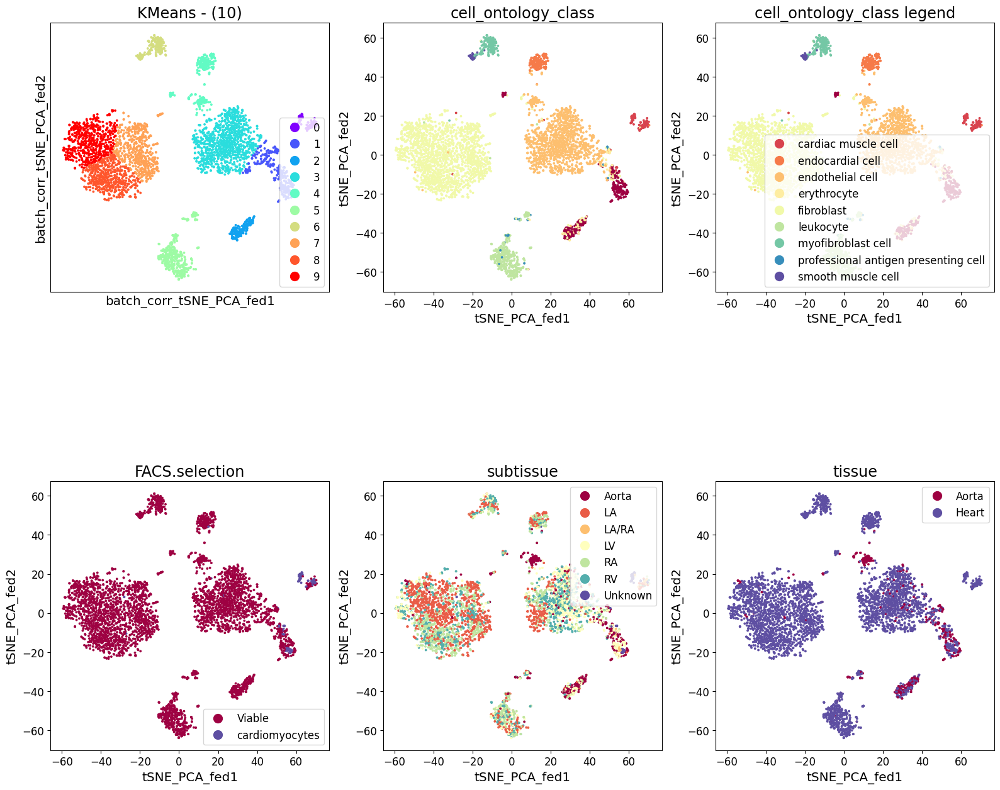

In [14]:
fig, ((ax1,ax2,ax3),(ax4,ax5,ax6)) = plt.subplots(2,3, figsize=(16,16), subplot_kw={'aspect':'equal'})

scprep.plot.scatter2d(data_batch_corrected_tsne_pca_fed, c=clusterings['KMeans'], cmap=plt.cm.rainbow, title='{} - ({})'.format('KMeans', len(np.unique(clusterings['KMeans']))), ticks=False, label_prefix="batch_corr_tSNE_PCA_fed", legend=True, discrete=True,ax=ax1)
scprep.plot.scatter2d(data_batch_corrected_tsne_pca_fed, c=annotation['cell_ontology_class'], title='cell_ontology_class', ax=ax2, cmap='Spectral', label_prefix="tSNE_PCA_fed",legend=False)
scprep.plot.scatter2d(data_batch_corrected_tsne_pca_fed, c=annotation['cell_ontology_class'], title='cell_ontology_class legend', ax=ax3, cmap='Spectral', label_prefix="tSNE_PCA_fed",legend=True)
scprep.plot.scatter2d(data_batch_corrected_tsne_pca_fed, c=metadata['FACS.selection'], title='FACS.selection', ax=ax4, cmap='Spectral', label_prefix="tSNE_PCA_fed",legend=True)
scprep.plot.scatter2d(data_batch_corrected_tsne_pca_fed, c=metadata['subtissue'], title='subtissue', ax=ax5, cmap='Spectral', label_prefix="tSNE_PCA_fed",legend=True)
scprep.plot.scatter2d(data_batch_corrected_tsne_pca_fed, c=annotation['tissue'], title='tissue', ax=ax6, cmap='Spectral', label_prefix="tSNE_PCA_fed",legend=True)

fig.tight_layout()

These graphs allow to see whether an association between biological known facts on the cells with the clusters identified with the KMeans method is possible. 
A noticeable trait is that the clusters well identified the cell onthology class. 
A starighforward mapping can be infered: 
0 -> Cardiac muscle cell //
1 -> ?? //
2 -> ?? //
3 -> Endothelial cell //
4 -> Endocardial & Endothelial cell //
5 -> Myofibroblast & smooth muscle cell //
6 -> Leukocyte //
7, 8 ,9 -> Fibroblast //

In addition looking at annotation['tissue'], 1 and 2 can be identified:
1 -> Aorta //
2 -> Aorta //

Finally 7,8,9 can be distinguished looking at subtissue:
7 -> Mix of left atrium, right atrium and right ventricule //
8 -> Right atrium //
9 -> Left atrium.

#### VI.2) Gene analysis of clusters
Attempt of identification of the most relevant gene of the cluster 2 which best identify Aorta cells through different scoring technique.
##### VI.2.1) ttest vs difference measure
Let's identify the genes of the cluster 2 which best maximise the ttest.

In [69]:
data_sparse = scprep.utils.SparseDataFrame(data)
clusters = clusterings["KMeans"]
curr_cluster = 2
ttest_results = scprep.stats.differential_expression(data_sparse[clusters == curr_cluster],
                                                         data_sparse[clusters != curr_cluster],
                                                         measure='ttest')
top_genes = ttest_results['ttest'].abs().sort_values(ascending=False)

Text(0.5, 0.98, 'Cluster 2 top_gene ttest method')

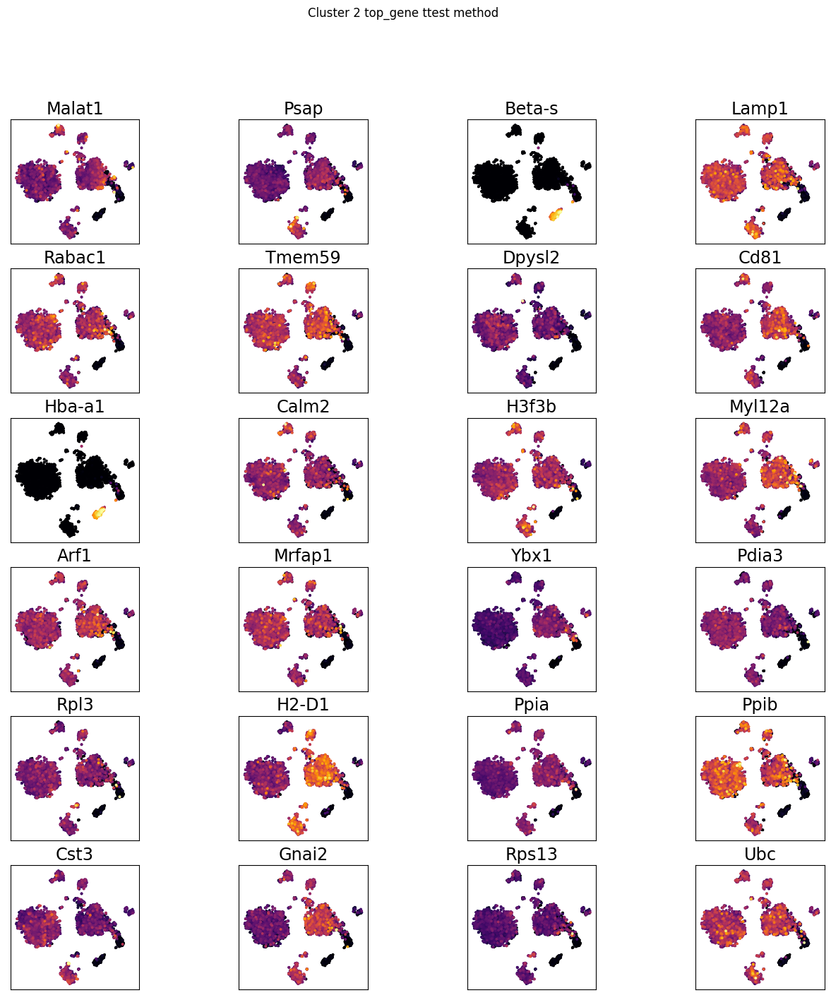

In [70]:
fig,axes = plt.subplots(6,4, figsize=(16,16), subplot_kw={'aspect':'equal'})
axes = axes.flatten()

gene_list=np.array(top_genes[0:0+24].index)
for gene, ax in zip(gene_list,axes):
    #legend = True if gene == gene_list[-1] else False
    expression = scprep.select.select_cols(data, exact_word=gene)
    sort_index = expression.sort_values().index
    
    scprep.plot.scatter2d(data_batch_corrected_tsne_pca_fed.loc[sort_index], c=expression.loc[sort_index], ax=ax, shuffle=False,
                       title=gene, ticks=None, xlabel='', ylabel='', legend=False)
fig.suptitle('Cluster 2 top_gene ttest method')

For the sake of visibility, no legend has been set, but the warmer / brighter the color is, the best the expression is for the cell. For instance, here, solely Beta-s and Hba-a1 are relevant enough for the cluster 2 using the ttest method. 

In [71]:
data_sparse = scprep.utils.SparseDataFrame(data)
clusters = clusterings["KMeans"]
curr_cluster = 2
ttest_results = scprep.stats.differential_expression(data_sparse[clusters == curr_cluster],
                                                         data_sparse[clusters != curr_cluster],
                                                         measure='difference')
top_genes = ttest_results['difference'].abs().sort_values(ascending=False)

Text(0.5, 0.98, 'Cluster 2 top_gene difference method')

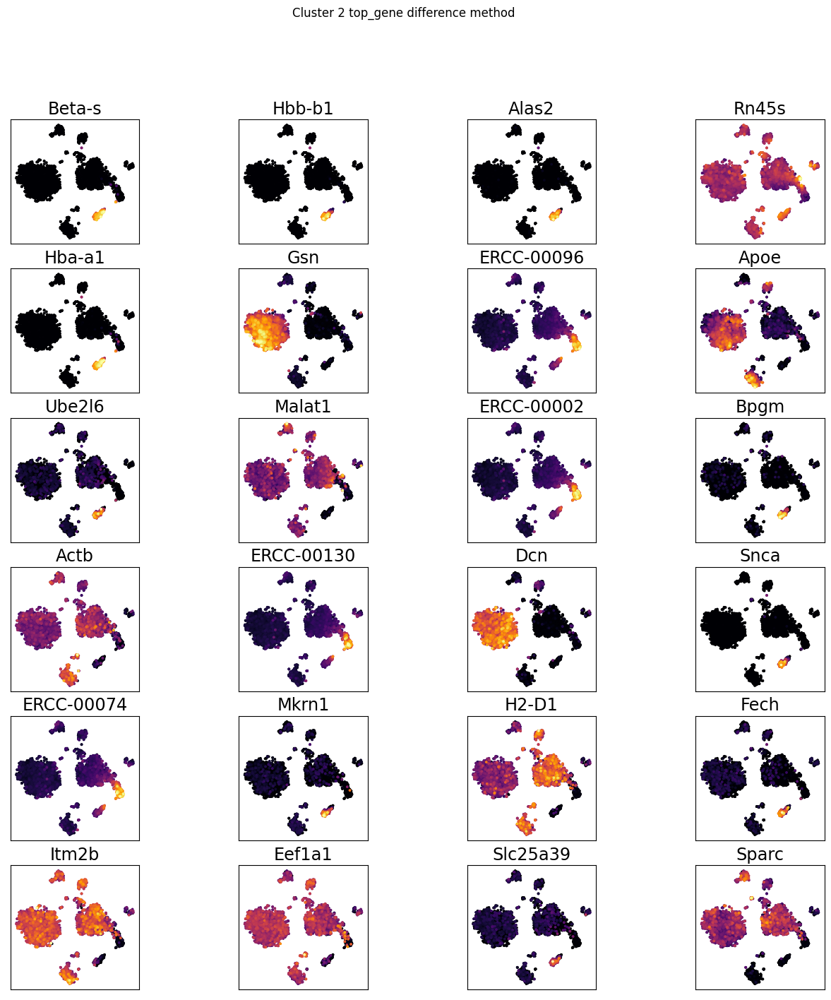

In [72]:
fig,axes = plt.subplots(6,4, figsize=(16,16), subplot_kw={'aspect':'equal'})
axes = axes.flatten()

gene_list=np.array(top_genes[0:0+24].index)
for gene, ax in zip(gene_list,axes):
    #legend = True if gene == gene_list[-1] else False
    expression = scprep.select.select_cols(data, exact_word=gene)
    sort_index = expression.sort_values().index
    
    scprep.plot.scatter2d(data_batch_corrected_tsne_pca_fed.loc[sort_index], c=expression.loc[sort_index], ax=ax, shuffle=False,
                       title=gene, ticks=None, xlabel='', ylabel='', legend=False)
fig.suptitle('Cluster 2 top_gene difference method')

Here the difference method is way more efficient in term of identifying the best genes in term of expression for cluster 2. Most of the genes ploted are relevant. Beta-s, Hbb-b1, Alas2 and Hba-a1 will be remembered.

The difference method is overall prefered as being more efficient. 

##### VI.2.2) Identification of a releveant gene for each cluster. 

In [51]:
data_sparse = scprep.utils.SparseDataFrame(data)
clusters = clusterings["KMeans"]
cluster_top_gene=pd.DataFrame(index=data.columns)
for i in range(len(np.unique(clusters))):
    curr_cluster = i
    ttest_results = scprep.stats.differential_expression(data_sparse[clusters == curr_cluster],
                                                         data_sparse[clusters != curr_cluster],
                                                         measure='difference')
    top_genes_i = ttest_results['difference'].abs()#.sort_values(ascending=False)
    cluster_top_gene['cluster '+str(i)]=top_genes_i.loc[data.columns].values

In [52]:
cluster_top_gene #This is a table gathering the score for a gene expecting to be a top gene for each cluster

,cluster 0,cluster 1,cluster 2,cluster 3,cluster 4,cluster 5,cluster 6,cluster 7,cluster 8,cluster 9
0610005C13Rik,0.005684,0.003588,0.002526,0.001427,0.001716,0.000459,0.001683,0.001113,0.002967,0.001870
0610007C21Rik,0.224992,0.843861,0.981002,0.152269,0.128253,0.334272,0.171080,0.527033,0.391172,0.392478
0610007L01Rik,0.043876,0.196895,0.279283,0.058329,0.027101,0.031986,0.032875,0.100313,0.001167,0.168431
0610007N19Rik,0.142116,0.287774,0.282667,0.351562,0.142322,0.294621,0.216370,0.437218,0.278197,0.375298
0610007P08Rik,0.027880,0.064033,0.091261,0.010097,0.025052,0.006296,0.010871,0.057627,0.008007,0.030969
...,...,...,...,...,...,...,...,...,...,...
Zyg11b,0.110073,0.136688,0.163543,0.006817,0.033919,0.027455,0.086035,0.012425,0.017279,0.039468
Zyx,0.528991,0.701583,0.823738,0.063017,0.225578,0.398707,0.125752,0.352315,0.115500,0.214220
Zzef1,0.055657,0.070978,0.143362,0.044932,0.060020,0.057754,0.045839,0.032522,0.037819,0.014085
Zzz3,0.005091,0.067684,0.124181,0.025239,0.081094,0.034885,0.032528,0.054521,0.006053,0.046100


In [37]:
cluster_top_gene.idxmax(axis=1) #This command allow to see which cluster will best represent a gene. 

0610005C13Rik    cluster 0
0610007C21Rik    cluster 2
0610007L01Rik    cluster 2
0610007N19Rik    cluster 7
0610007P08Rik    cluster 2
                   ...    
Zyg11b           cluster 2
Zyx              cluster 2
Zzef1            cluster 2
Zzz3             cluster 2
l7Rn6            cluster 2
Length: 17849, dtype: object

In [39]:
cluster_top_gene[cluster_top_gene.idxmax(axis=1)=='cluster 2']['cluster 2'].sort_values(ascending=False)
#For instance, here the genes are filtered according whether they are best identified by the cluster 2 and then sorted. 

Beta-s           55.351499
Hbb-b1           20.114091
Alas2            19.050255
Rn45s            18.276538
Hba-a1           13.040538
                   ...    
Jph4              0.001306
1700057G04Rik     0.001051
Zpld1             0.001006
Olfr141           0.000924
Car5a             0.000610
Name: cluster 2, Length: 5345, dtype: float64

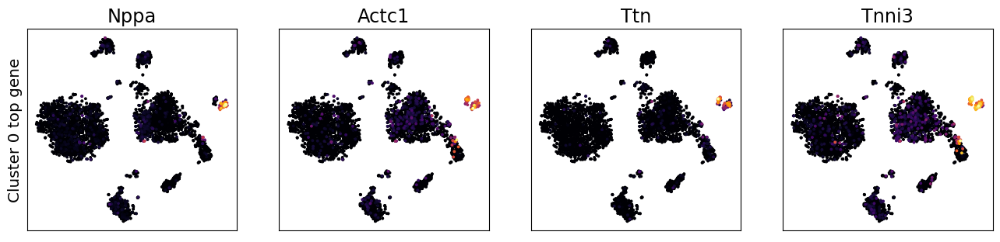

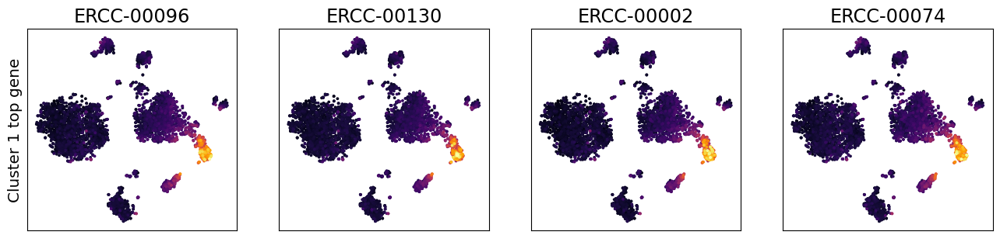

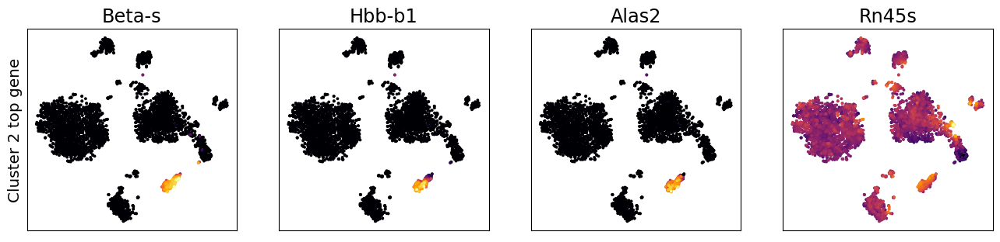

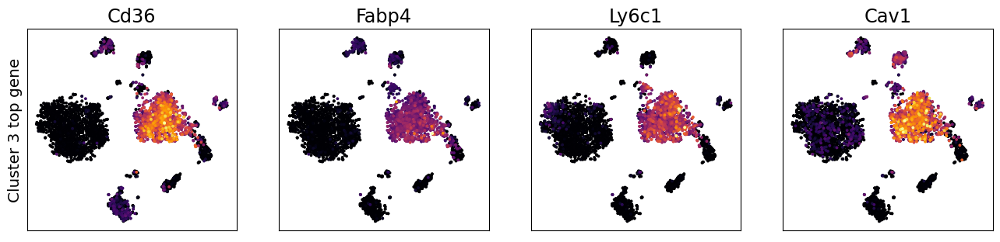

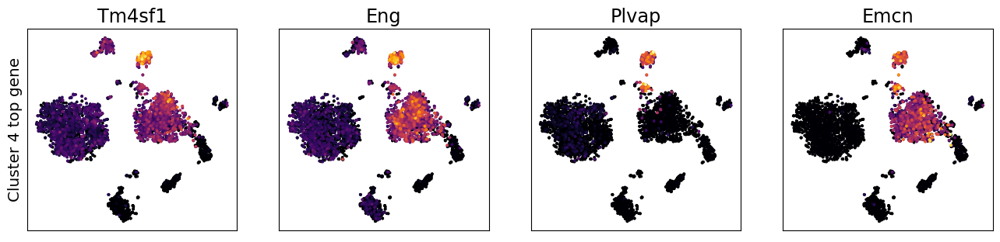

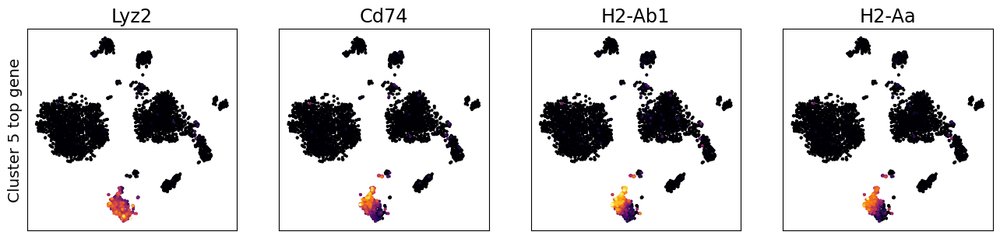

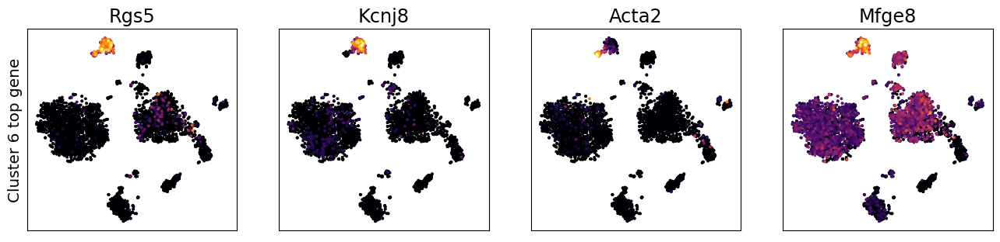

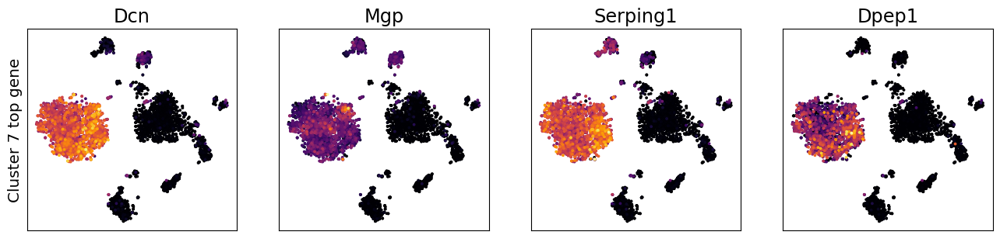

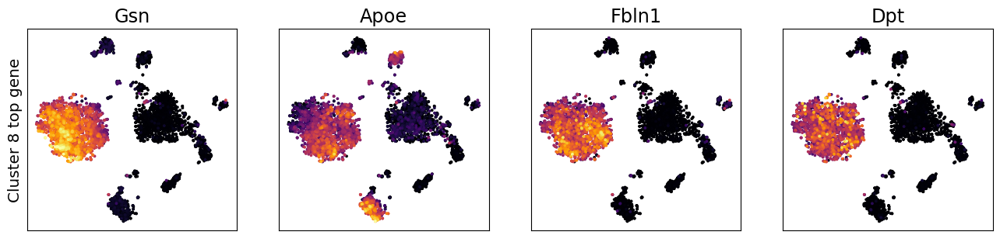

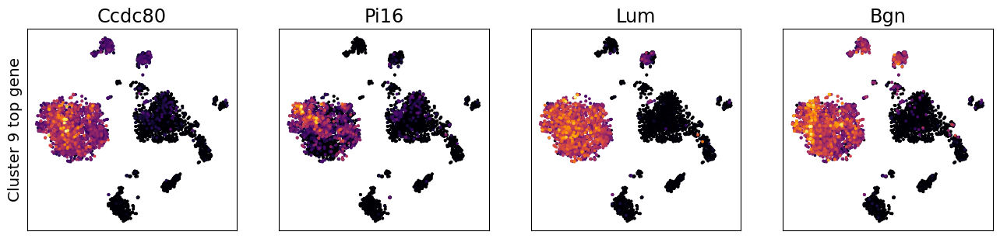

In [63]:
for i in range(len(np.unique(clusters))):
    
    fig,axes = plt.subplots(1,4, figsize=(16,16), subplot_kw={'aspect':'equal'})
    axes = axes.flatten()

    gene_list=np.array(cluster_top_gene[cluster_top_gene.idxmax(axis=1)=='cluster '+str(i)]['cluster '+str(i)].sort_values(ascending=False)[0:100].index)
    for gene, ax in zip(gene_list,axes):
        ylabel = 'Cluster '+str(i)+' top gene' if gene == gene_list[0] else ''
        expression = scprep.select.select_cols(data, exact_word=gene)
        sort_index = expression.sort_values().index
    
        scprep.plot.scatter2d(data_batch_corrected_tsne_pca_fed.loc[sort_index], c=expression.loc[sort_index], ax=ax, shuffle=False, ticks=None, xlabel='', ylabel=ylabel, legend=False, title=gene)

The method elaborated proves to be efficient to screen relevant gene for each cluster. Let's select one gene for each cluster and perform a jitterplot to better visualize how well a gene is expressed among its cluster. 
##### VI.2.2) Jitterplot

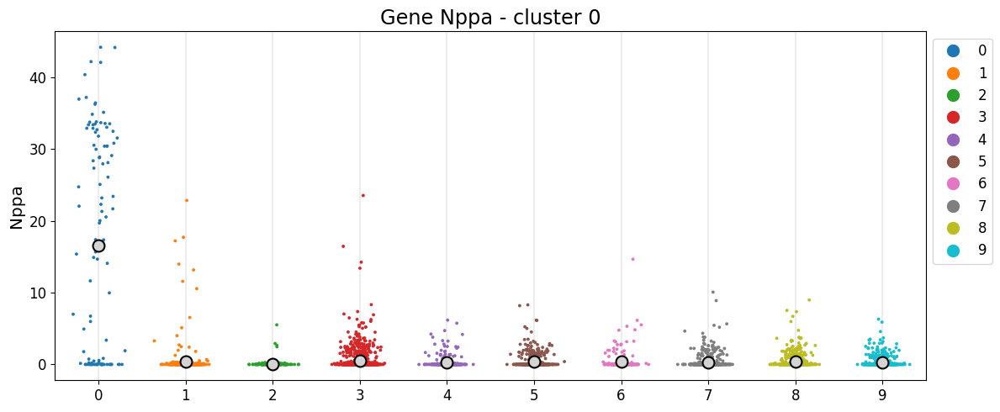

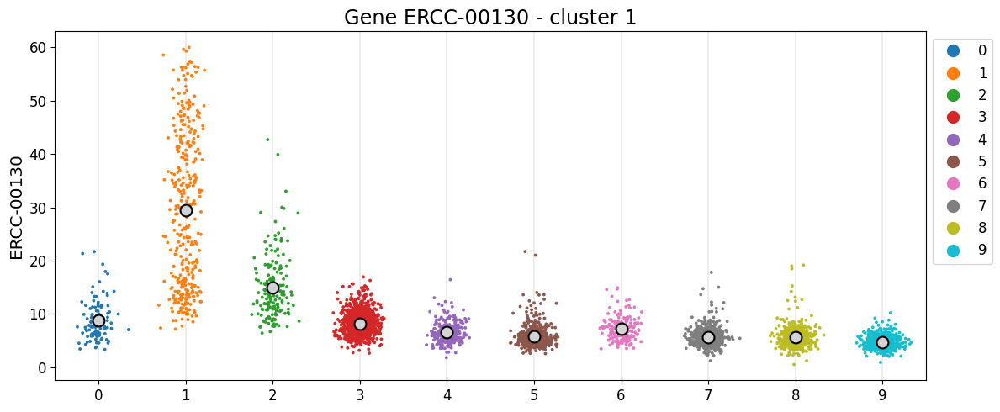

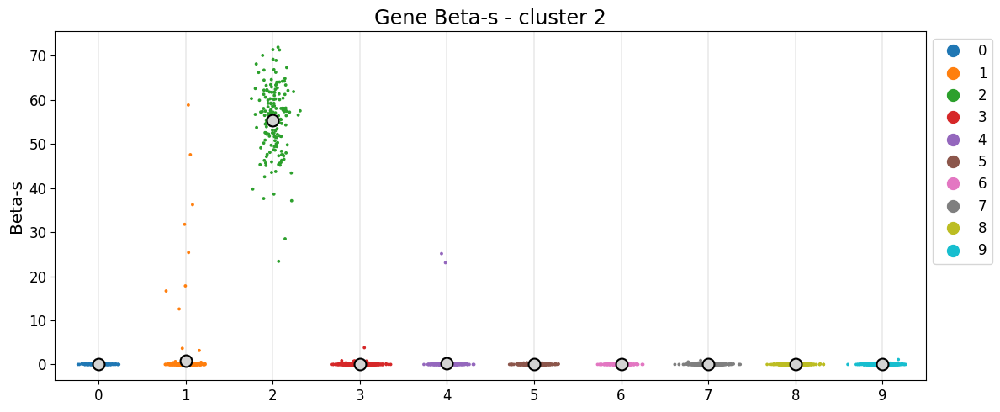

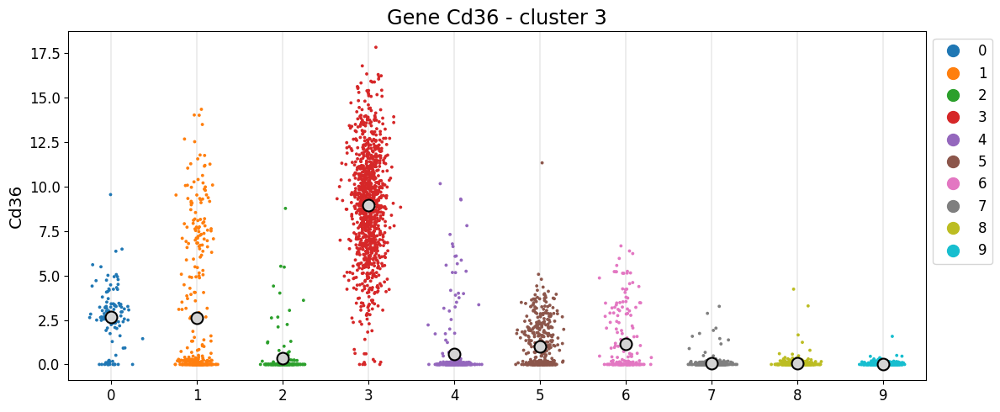

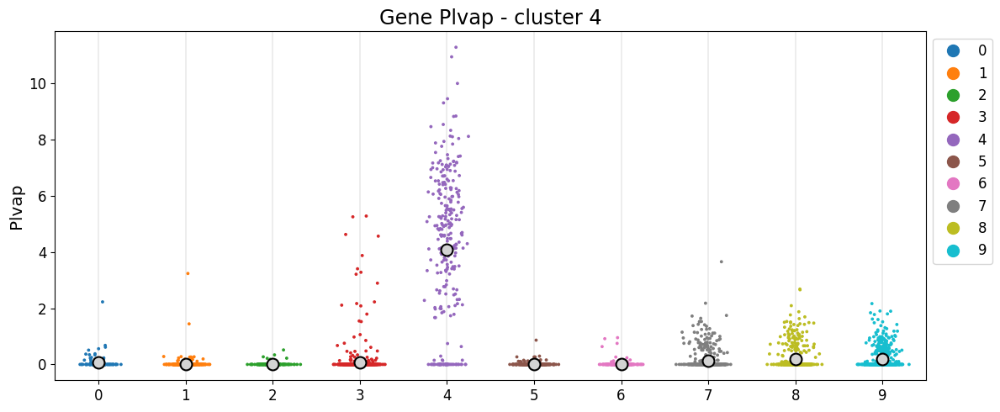

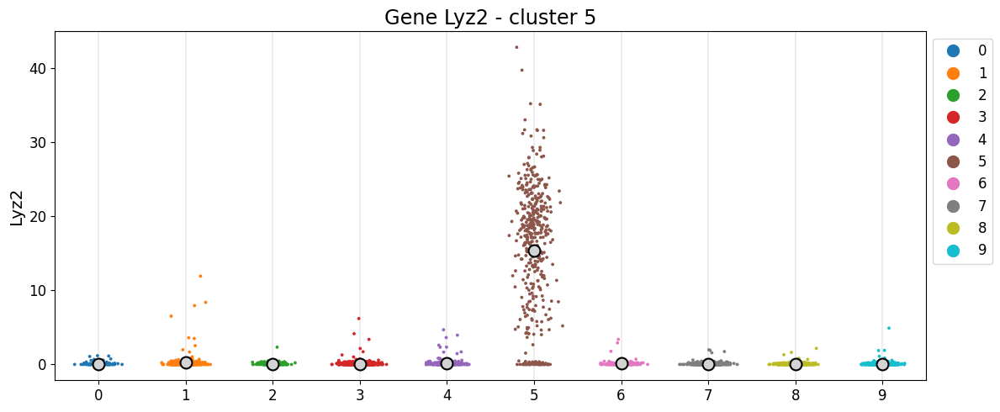

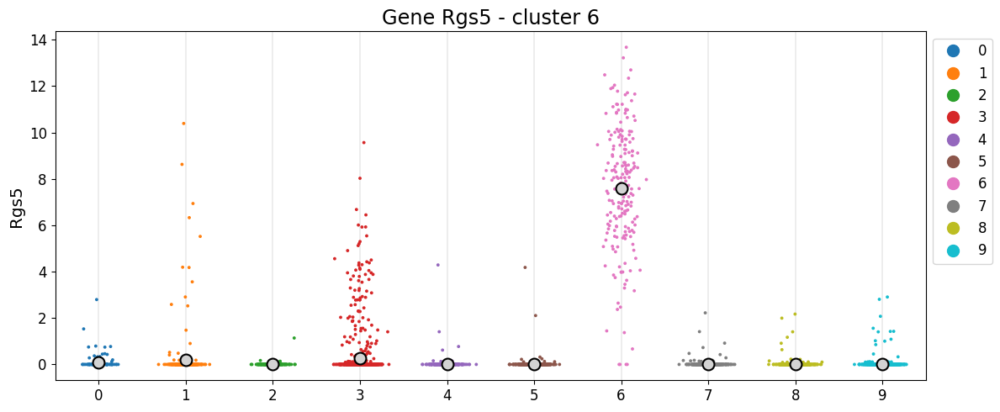

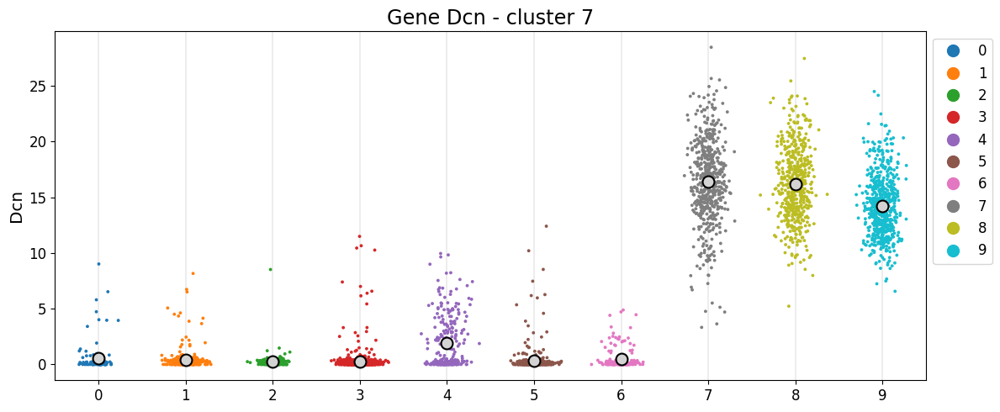

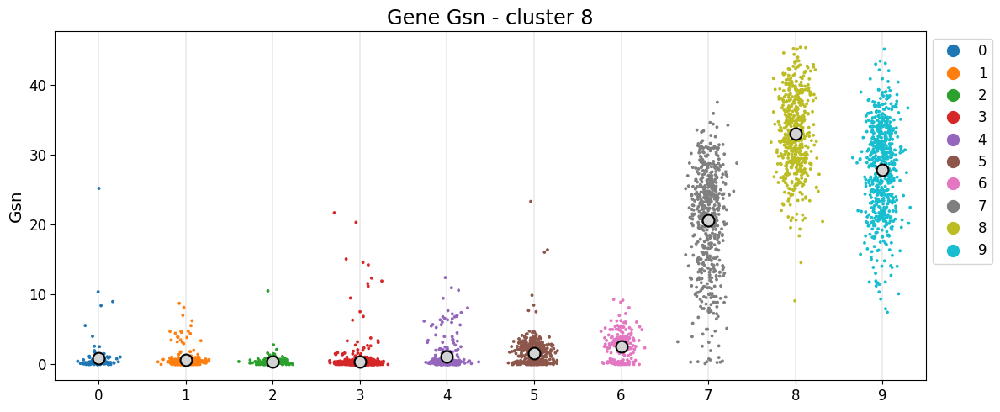

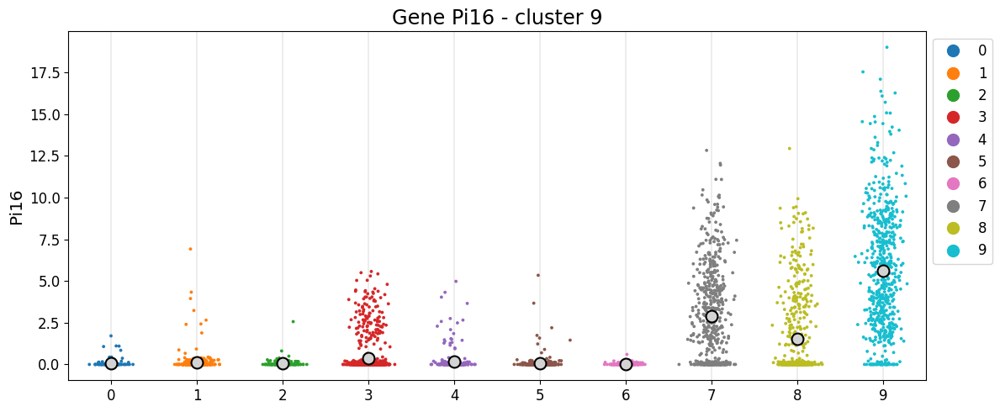

In [79]:
Best_gene_list=['Nppa','ERCC-00130','Beta-s','Cd36', 'Plvap', 'Lyz2', 'Rgs5', 'Dcn', 'Gsn','Pi16']
for i, curr_gene in enumerate(Best_gene_list):
    curr_expression = scprep.select.select_cols(data, exact_word=curr_gene)
    scprep.plot.jitter(clusters, curr_expression, c=clusters, figsize=(12, 5),
                   legend_anchor=(1,1), title='Gene '+curr_gene+' - cluster '+str(i))

The interest of these plot will be discuss in conclusion, but it allow to see how specific a gene is regarding its associated cluster.

# VII Discussion

The goal of this project was to study the difference in term of gene expression in Aorta and Heart cells from mice. 
Through filtering of the original data, batch effect correction, and then projection with the tSNE reduction method fed with PCA reduction method, clusters with the KMeans method has been possible. These clusters proved to be relevant in term of biological interpretation using the data from metadata and annotation. The difference in term of gene expression has finally been studied using the difference in mean expression for each clusters and by identifying the best genes associated to each clusters. 

Different genes for each clusters has been identified and those are specific enough as enlighten by the Jitterplot. Each clusters are specific for either a type of cell, either a different localisation. Without detail every clusters, a reason which might explain the similarity of 7,8,9 but yet difference is that all of these clusters indicate fibroblast cells, so all of them are similar but some difference are observed in the jitterplot due to the fact that it comes from different localisation in the heart: 

7 -> Mix of left atrium, right atrium and right ventricule 

8 -> Right atrium 

9 -> Left atrium

Without detail all of the genes, let's just consider the gene found for cluster 0 associated to cardiac muscle cell / cardiomyocites and the cluster 2 associated to the Aorta to see if the method of gene identification is relevant. For the cluster 0, a relevant gene identified was Nppa, which happen to be primarly expressed in cardiomyocites: https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4496260/. For the cluster 2, Beta-s, Hbb-b1, Alas2 and Hba-a1 previously identified happen to be hemoglobin gene: https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4269175/. As Aorta is the biggest channel of blood, those gene should be relevant for this tissue. The litterature support the finding and therefore valid the method used. 

Furthermore, this project was also the opportunity to test different method of projection: PCA, UMAP, UMAP (PCA fed), tSNE, tSNE (PCA fed), to see which projection is the most satisfying in term of clustering. The batch effect correction has been tested both before and after dimension reduction. Different clustering has been also teste: Phenotype, KMeans, Spectral. And gene screening has been done using the "ttest" statistical method and "difference" statistical method. 

The best practice found is: tSNE (PCA fed) / batch effect before dimension reduction / KMeans / "difference" statistical method. 